In [2]:
import numpy as np 
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


import json
from collections import defaultdict,OrderedDict

import matplotlib.pyplot as plt

from sklearn.tree import DecisionTreeClassifier


In [ ]:
#Mount the drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import json
train = json.load(open('drive/My Drive/CGAS/train.json'))
#test = read_data('drive/My Drive/CGAS/test.json')

In [ ]:
train_df = pd.DataFrame.from_dict(train)

In [ ]:
type(train_df)

pandas.core.frame.DataFrame

In [ ]:
#Remove Duplicates  rows
# print(len(df))
print("No of rows before removing duplicate rows",len(train_df))
print(train_df.loc[train_df.astype(str).drop_duplicates().index])

print("No of rows after removing duplicate rows",len(train_df))

No of rows before removing duplicate rows 39774
          id      cuisine                                        ingredients
0      10259        greek  [romaine lettuce, black olives, grape tomatoes...
1      25693  southern_us  [plain flour, ground pepper, salt, tomatoes, g...
2      20130     filipino  [eggs, pepper, salt, mayonaise, cooking oil, g...
3      22213       indian                [water, vegetable oil, wheat, salt]
4      13162       indian  [black pepper, shallots, cornflour, cayenne pe...
...      ...          ...                                                ...
39769  29109        irish  [light brown sugar, granulated sugar, butter, ...
39770  11462      italian  [KRAFT Zesty Italian Dressing, purple onion, b...
39771   2238        irish  [eggs, citrus fruit, raisins, sourdough starte...
39772  41882      chinese  [boneless chicken skinless thigh, minced garli...
39773   2362      mexican  [green chile, jalapeno chilies, onions, ground...

[39774 rows x 3 columns]
No

In [ ]:
kf = train_df.dropna(how = 'all')
print(train_df.shape," ",kf.shape)

(39774, 3)   (39774, 3)


In [ ]:
#analysis2
#find percentage of null values 
df_missing=train_df.isna()
df_count_missing=df_missing.sum()
per_none_value=df_count_missing/len(df_count_missing)
per_none_value.sort_values(ascending=False,inplace=True)
print("% of null values in each column")
print(per_none_value)

% of null values in each column
ingredients    0.0
cuisine        0.0
id             0.0
dtype: float64


{'jamaican', 'chinese', 'french', 'mexican', 'italian', 'british', 'russian', 'moroccan', 'indian', 'vietnamese', 'korean', 'spanish', 'brazilian', 'southern_us', 'greek', 'irish', 'thai', 'japanese', 'filipino', 'cajun_creole'}


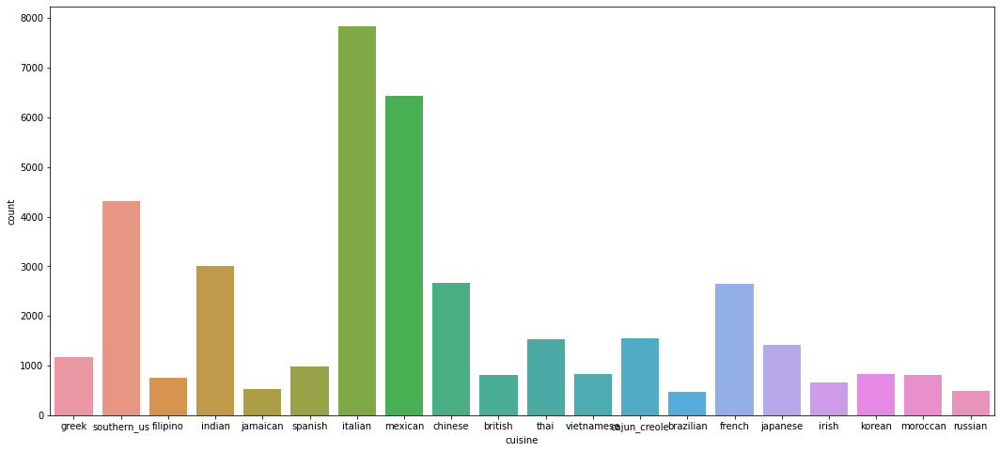

In [ ]:
train_df.groupby('cuisine').size()
print(set(train_df['cuisine']))
from scipy.stats import norm 
from matplotlib import pyplot as plt
import seaborn as sns

plt.figure(figsize=(18,8))
sns.countplot(x='cuisine', data=train_df)

In [3]:
#Technique 1 using ingredient list of 20 cuisines and matching ingredients
with open (r'C:\Users\acer\Desktop\Era\IIIT_DELHI\SEM3\CGAS\project\cuisine\whats-cooking\train.json\train.json') as jsonfile:
    train=json.load(jsonfile)
print("id       cuisine       ingredients")
for i in train:
    for j in i['ingredients']:
        print("%s     %s    %s"%(i['id'],i['cuisine'],j))

id       cuisine       ingredients
10259     greek    romaine lettuce
10259     greek    black olives
10259     greek    grape tomatoes
10259     greek    garlic
10259     greek    pepper
10259     greek    purple onion
10259     greek    seasoning
10259     greek    garbanzo beans
10259     greek    feta cheese crumbles
25693     southern_us    plain flour
25693     southern_us    ground pepper
25693     southern_us    salt
25693     southern_us    tomatoes
25693     southern_us    ground black pepper
25693     southern_us    thyme
25693     southern_us    eggs
25693     southern_us    green tomatoes
25693     southern_us    yellow corn meal
25693     southern_us    milk
25693     southern_us    vegetable oil
20130     filipino    eggs
20130     filipino    pepper
20130     filipino    salt
20130     filipino    mayonaise
20130     filipino    cooking oil
20130     filipino    green chilies
20130     filipino    grilled chicken breasts
20130     filipino    garlic powder
20130     fil

41301     moroccan    saffron
41301     moroccan    pepper
41301     moroccan    flour
41301     moroccan    fresh parsley
16712     moroccan    ground cinnamon
16712     moroccan    lamb neck fillets
16712     moroccan    tomatoes
16712     moroccan    chopped parsley
16712     moroccan    paprika
28250     italian    eggplant
28250     italian    low sodium chicken broth
28250     italian    fresh basil leaves
28250     italian    pepper
28250     italian    grated parmesan cheese
28250     italian    goat cheese
28250     italian    zucchini
28250     italian    salt
28250     italian    polenta
28250     italian    water
28250     italian    bell pepper
28250     italian    olive oil cooking spray
34209     indian    sugar
34209     indian    water
34209     indian    cauliflower florets
34209     indian    chili sauce
34209     indian    sweet chili sauce
34209     indian    maida flour
34209     indian    salt
34209     indian    oil
34209     indian    soy sauce
34209     indian

11995     vietnamese    fish sauce
11995     vietnamese    lime juice
11995     vietnamese    shredded carrots
11995     vietnamese    rice vermicelli
11995     vietnamese    english cucumber
30926     indian    curry powder
30926     indian    cooked shrimp
30926     indian    flaked coconut
30926     indian    green onions
30926     indian    cream cheese, soften
8547     greek    dry white wine
8547     greek    leaf parsley
8547     greek    greek yogurt
8547     greek    mussels
8547     greek    shallots
8547     greek    olive oil
8715     southern_us    corn kernels
8715     southern_us    chopped fresh thyme
8715     southern_us    flat leaf parsley
8715     southern_us    large eggs
8715     southern_us    grated nutmeg
8715     southern_us    sugar
8715     southern_us    whole milk
8715     southern_us    cayenne pepper
8715     southern_us    unsalted butter
8715     southern_us    salt
41161     cajun_creole    chicken broth
41161     cajun_creole    cayenne pepper
41161 

7212     indian    onions
7212     indian    red chili powder
7212     indian    garlic
7212     indian    oil
7212     indian    garam masala
7212     indian    green chilies
7212     indian    ground turmeric
35436     greek    kosher salt
35436     greek    feta cheese
35436     greek    grated lemon zest
35436     greek    ground lamb
35436     greek    unsalted chicken stock
35436     greek    crushed tomatoes
35436     greek    cooking spray
35436     greek    oven-ready lasagna noodles
35436     greek    fresh rosemary
35436     greek    minced garlic
35436     greek    ground black pepper
35436     greek    chopped onion
35436     greek    extra lean ground beef
35436     greek    olive oil
35436     greek    part-skim ricotta cheese
35436     greek    flat leaf parsley
36578     thai    unsweetened coconut milk
36578     thai    vegetable oil
36578     thai    red bell pepper
36578     thai    boneless chicken skinless thigh
36578     thai    yellow curry paste
36578     thai 

26364     korean    eggs
26364     korean    water
26364     korean    sesame oil
26364     korean    scallions
26364     korean    hot red pepper flakes
26364     korean    sesame seeds
26364     korean    rice vinegar
26364     korean    brown sugar
26364     korean    olive oil
26364     korean    salt
26364     korean    cold water
26364     korean    soy sauce
26364     korean    red cabbage
26364     korean    pancake mix
30670     italian    fresh marjoram
30670     italian    butter
30670     italian    wild mushrooms
30670     italian    olive oil
30670     italian    low salt chicken broth
30670     italian    shallots
30670     italian    boneless skinless chicken breast halves
30670     italian    marsala wine
30670     italian    whipping cream
32330     british    vanilla
32330     british    powdered sugar
32330     british    sour cream
32330     british    heavy cream
32330     british    cream cheese
31736     southern_us    ground black pepper
31736     southern_us  

46397     italian    large eggs
46397     italian    garlic
46397     italian    chicken thighs
46397     italian    tomatoes
46397     italian    panko
46397     italian    parsley
46397     italian    thyme
46397     italian    oregano
46397     italian    tomato paste
46397     italian    rosemary
46397     italian    flour
46397     italian    salt
46397     italian    spaghetti
46397     italian    black pepper
46397     italian    parmigiano reggiano cheese
46397     italian    extra-virgin olive oil
46397     italian    onions
19164     southern_us    extra sharp white cheddar cheese
19164     southern_us    butter
19164     southern_us    carrots
19164     southern_us    onions
19164     southern_us    dry vermouth
19164     southern_us    chopped fresh thyme
19164     southern_us    garlic cloves
19164     southern_us    bay leaf
19164     southern_us    fresh thyme
19164     southern_us    apples
19164     southern_us    low salt chicken broth
19164     southern_us    smoked 

27048     italian    raisins
27048     italian    onions
27048     italian    pasta sauce
27048     italian    ground black pepper
27048     italian    round steaks
18572     mexican    pepper
18572     mexican    olive oil
18572     mexican    salt
18572     mexican    ground beef
18572     mexican    dried oregano
18572     mexican    fresh cilantro
18572     mexican    zucchini
18572     mexican    garlic cloves
18572     mexican    panko breadcrumbs
18572     mexican    water
18572     mexican    poblano peppers
18572     mexican    beef broth
18572     mexican    onions
18572     mexican    ground cumin
18572     mexican    eggs
18572     mexican    lime
18572     mexican    chili powder
18572     mexican    corn tortillas
18572     mexican    basmati rice
30490     mexican    lime juice
30490     mexican    green onions
30490     mexican    fresh lime juice
30490     mexican    green cabbage
30490     mexican    red cabbage
30490     mexican    fat free greek yogurt
30490     mex

29649     jamaican    chile pepper
29649     jamaican    pork loin chops
47822     italian    ground black pepper
47822     italian    cauliflower
47822     italian    extra-virgin olive oil
47822     italian    pecorino romano cheese
47822     italian    kosher salt
47822     italian    chopped parsley
44667     italian    marsala wine
44667     italian    unsalted butter
44667     italian    large garlic cloves
44667     italian    dried oregano
44667     italian    dried thyme
44667     italian    veal cutlets
44667     italian    all-purpose flour
44667     italian    black pepper
44667     italian    mushrooms
44667     italian    salt
44667     italian    olive oil
44667     italian    beef demi-glace
44667     italian    flat leaf parsley
22615     greek    pepper
22615     greek    parsley
22615     greek    spinach
22615     greek    feta cheese
22615     greek    dill
22615     greek    eggs
22615     greek    olive oil
22615     greek    salt
22615     greek    phyllo dough


42269     chinese    sugar
42269     chinese    salt
42269     chinese    active dry yeast
38355     vietnamese    mint
38355     vietnamese    herbs
38355     vietnamese    cilantro
38355     vietnamese    banh hoi
38355     vietnamese    black pepper
38355     vietnamese    shallots
38355     vietnamese    garlic
38355     vietnamese    oil
38355     vietnamese    light brown sugar
38355     vietnamese    tri tip
38355     vietnamese    butter
38355     vietnamese    salt
38355     vietnamese    fish sauce
38355     vietnamese    regular soy sauce
38355     vietnamese    dipping sauces
38355     vietnamese    english cucumber
27825     irish    ground black pepper
27825     irish    whole milk
27825     irish    fine salt
27825     irish    unsalted butter
27825     irish    yukon gold potatoes
27825     irish    large eggs
27825     irish    all-purpose flour
32431     italian    ground pepper
32431     italian    garlic
32431     italian    coarse salt
32431     italian    fresh th

19671     mexican    cooked rice
19671     mexican    unsalted butter
19671     mexican    jalapeno chilies
19671     mexican    boneless beef chuck roast
19671     mexican    adobo sauce
19671     mexican    shredded Monterey Jack cheese
37444     southern_us    pepper
37444     southern_us    worcestershire sauce
37444     southern_us    pimentos
37444     southern_us    sharp cheddar cheese
37444     southern_us    mayonaise
37444     southern_us    ground red pepper
37444     southern_us    onions
37444     southern_us    dijon mustard
37444     southern_us    salt
10888     indian    pepper
10888     indian    diced tomatoes
10888     indian    salt
10888     indian    carrots
10888     indian    cumin
10888     indian    garam masala
10888     indian    cauliflower florets
10888     indian    garlic cloves
10888     indian    coriander
10888     indian    olive oil
10888     indian    ginger
10888     indian    chickpeas
10888     indian    onions
10888     indian    tumeric
1088

37464     italian    parmigiano reggiano cheese
37464     italian    ricotta cheese
37464     italian    all-purpose flour
37464     italian    fresh marjoram
37464     italian    ground black pepper
37464     italian    leeks
37464     italian    salt
37464     italian    dough
37464     italian    swiss chard
37464     italian    egg yolks
37464     italian    extra-virgin olive oil
7664     italian    dry white wine
7664     italian    garlic
7664     italian    bay leaf
7664     italian    tomatoes
7664     italian    extra-virgin olive oil
7664     italian    white wine vinegar
7664     italian    chicken stock
7664     italian    sea salt
7664     italian    black olives
7664     italian    chicken
7664     italian    chicken legs
7664     italian    rosemary leaves
7664     italian    yellow onion
38732     french    large egg yolks
38732     french    vegetable shortening
38732     french    salt
38732     french    pÃ¢te brisÃ©e
38732     french    cinnamon
38732     french   

1122     greek    feta cheese crumbles
13921     chinese    bread crumbs
13921     chinese    sesame seeds
13921     chinese    eggs
13921     chinese    broccolini
13921     chinese    skinless chicken breasts
13921     chinese    caster sugar
13921     chinese    lemon
13921     chinese    soy sauce
13921     chinese    lime
13921     chinese    chinese five-spice powder
24944     indian    rose water
24944     indian    french fried onions
24944     indian    salt
24944     indian    chicken pieces
24944     indian    red chili powder
24944     indian    garam masala
24944     indian    ginger
24944     indian    oil
24944     indian    basmati rice
24944     indian    tomatoes
24944     indian    milk
24944     indian    butter
24944     indian    curds
24944     indian    onions
24944     indian    tumeric
24944     indian    coriander powder
24944     indian    garlic
24944     indian    bay leaf
24944     indian    saffron
25967     italian    ditalini
25967     italian    rosem

32169     indian    salt
32169     indian    ground cardamom
32169     indian    garlic paste
32169     indian    cinnamon
32169     indian    cumin seed
32169     indian    clarified butter
5379     southern_us    kosher salt
5379     southern_us    paprika
5379     southern_us    file powder
5379     southern_us    dark brown sugar
5379     southern_us    ground black pepper
5379     southern_us    dry mustard
5379     southern_us    turkey
5379     southern_us    peanut oil
26634     japanese    soy sauce
26634     japanese    ginger
26634     japanese    sake
26634     japanese    mirin
26634     japanese    sesame seeds
26634     japanese    sugar
26634     japanese    boneless skinless chicken breasts
31172     cajun_creole    scallion greens
31172     cajun_creole    cayenne
31172     cajun_creole    salt
31172     cajun_creole    reduced sodium chicken broth
31172     cajun_creole    large garlic cloves
31172     cajun_creole    smoked turkey drumstick
31172     cajun_creole   

14753     indian    coriander
44694     italian    mascarpone
44694     italian    instant espresso
44694     italian    orange
44694     italian    orange rind
44694     italian    ladyfingers
44694     italian    cognac
44694     italian    fat free cream cheese
44694     italian    sugar
44694     italian    hot water
44694     italian    unsweetened cocoa powder
10687     russian    pickling salt
10687     russian    water
10687     russian    fresh tarragon
10687     russian    vinegar
10687     russian    garlic
10687     russian    red chili peppers
10687     russian    pickling cucumbers
40929     southern_us    sugar
40929     southern_us    baking powder
40929     southern_us    salt
40929     southern_us    eggs
40929     southern_us    baking soda
40929     southern_us    butter
40929     southern_us    chopped pecans
40929     southern_us    water
40929     southern_us    almond extract
40929     southern_us    all-purpose flour
40929     southern_us    brown sugar
40929  

4849     moroccan    ground cinnamon
4849     moroccan    olive oil
4849     moroccan    mint leaves
4849     moroccan    paprika
4849     moroccan    shelled pistachios
4849     moroccan    squash
4849     moroccan    milk
4849     moroccan    harissa paste
4849     moroccan    lemon
4849     moroccan    blanched almonds
4849     moroccan    greek yogurt
4849     moroccan    ground cumin
4849     moroccan    fresh spinach
4849     moroccan    coriander seeds
4849     moroccan    shallots
4849     moroccan    ginger
4849     moroccan    garlic cloves
4849     moroccan    phyllo pastry
17131     mexican    flour tortillas
17131     mexican    green chilies
17131     mexican    onions
17131     mexican    chicken breasts
17131     mexican    chillies
17131     mexican    soup
17131     mexican    sour cream
17131     mexican    cheese
17131     mexican    cream of mushroom soup
37310     italian    hot red pepper flakes
37310     italian    garlic
37310     italian    dry white wine
3731

4414     thai    chicken stock
4414     thai    green onions
4414     thai    dark brown sugar
4414     thai    soy sauce
4414     thai    pineapple
4414     thai    cooked white rice
4414     thai    red chili peppers
4414     thai    shallots
4414     thai    cooked shrimp
4414     thai    curry powder
4414     thai    garlic
4414     thai    canola oil
8457     mexican    black beans
8457     mexican    finely chopped onion
8457     mexican    queso fresco
8457     mexican    sliced green onions
8457     mexican    sherry vinegar
8457     mexican    cooking spray
8457     mexican    canned tomatoes
8457     mexican    olive oil
8457     mexican    pumpkin
8457     mexican    dry sherry
8457     mexican    ground cumin
8457     mexican    fat free less sodium chicken broth
8457     mexican    ground black pepper
8457     mexican    pumpkinseed kernels
8457     mexican    garlic cloves
25760     indian    eggplant
25760     indian    sunflower oil
25760     indian    coriander
25760  

8819     spanish    milk
8819     spanish    freshly ground pepper
8819     spanish    kosher salt
8819     spanish    swiss cheese
8819     spanish    eggs
8819     spanish    olive oil
8819     spanish    tarragon leaves
19018     japanese    tofu
19018     japanese    mirin
19018     japanese    scallions
19018     japanese    minced garlic
19018     japanese    shoyu
19018     japanese    corn starch
19018     japanese    chicken stock
19018     japanese    sesame oil
19018     japanese    oyster sauce
19018     japanese    minced ginger
19018     japanese    hot bean paste
11283     italian    olive oil
11283     italian    penne pasta
11283     italian    tomatoes
11283     italian    garlic
11283     italian    fresh asparagus
11283     italian    pepper
11283     italian    salt
11283     italian    heavy cream
11283     italian    fresh mushrooms
10460     french    milk
10460     french    green onions
10460     french    freshly ground pepper
10460     french    half & half


48619     mexican    liquid
48619     mexican    dried oregano
48619     mexican    coarse salt
48619     mexican    garlic cloves
48619     mexican    ground cumin
48619     mexican    diced tomatoes
48619     mexican    chipotle peppers
36717     korean    fresh shiitake mushrooms
36717     korean    dark brown sugar
36717     korean    toasted sesame oil
36717     korean    kosher salt
36717     korean    baby spinach
36717     korean    garlic cloves
36717     korean    noodles
36717     korean    soy sauce
36717     korean    vegetable oil
36717     korean    scallions
36717     korean    toasted sesame seeds
36717     korean    ground black pepper
36717     korean    yellow onion
36717     korean    carrots
18017     vietnamese    boneless chicken skinless thigh
18017     vietnamese    Sriracha
18017     vietnamese    bamboo shoots
18017     vietnamese    minced garlic
18017     vietnamese    oil
18017     vietnamese    kosher salt
18017     vietnamese    peanut sauce
18017     v

31896     southern_us    eggs
31896     southern_us    garlic
31896     southern_us    shrimp
31896     southern_us    mirlitons
31896     southern_us    olive oil
31896     southern_us    ham
31896     southern_us    pepper
31896     southern_us    salt
31896     southern_us    fresh parsley
46845     mexican    tomatillos
46845     mexican    ramps
46845     mexican    garlic chives
46845     mexican    salt
46845     mexican    chopped cilantro fresh
46845     mexican    olive oil
46845     mexican    serrano
46845     mexican    avocado
46845     mexican    bacon
46845     mexican    fresh lime juice
36821     japanese    rice vinegar
36821     japanese    radishes
36821     japanese    cucumber
36821     japanese    salt
24166     japanese    sugar
24166     japanese    curry powder
24166     japanese    tahini
24166     japanese    chickpeas
24166     japanese    frozen peas
24166     japanese    tomato paste
24166     japanese    chili pepper
24166     japanese    chopped tomato

16704     mexican    fresh lime juice
16704     mexican    jalapeno chilies
16704     mexican    garlic cloves
39181     mexican    pasta
39181     mexican    shredded cheese
39181     mexican    cream cheese
39181     mexican    water
39181     mexican    ground beef
39181     mexican    taco seasoning
10054     spanish    saffron threads
10054     spanish    green bell pepper
10054     spanish    olive oil
10054     spanish    spanish chorizo
10054     spanish    onions
10054     spanish    arborio rice
10054     spanish    kosher salt
10054     spanish    parsley
10054     spanish    shrimp
10054     spanish    tomatoes
10054     spanish    minced garlic
10054     spanish    littleneck clams
10054     spanish    red bell pepper
10054     spanish    mussels
10054     spanish    reduced sodium chicken broth
10054     spanish    dry white wine
10054     spanish    spanish paprika
16858     korean    soy sauce
16858     korean    kosher salt
16858     korean    chicken wings
16858     k

48445     japanese    nonfat dry milk powder
48445     japanese    slivered almonds
48445     japanese    whole milk ricotta cheese
48445     japanese    unsalted butter
48445     japanese    ground cardamom
30472     southern_us    sugar
30472     southern_us    salt
30472     southern_us    baking powder
30472     southern_us    white cornmeal
30472     southern_us    half & half
30472     southern_us    softened butter
30472     southern_us    vegetable oil
30472     southern_us    boiling water
14046     filipino    pork
14046     filipino    vegetable oil
14046     filipino    onions
14046     filipino    soy sauce
14046     filipino    garlic
14046     filipino    rice paper
14046     filipino    ground black pepper
14046     filipino    salt
14046     filipino    green cabbage
14046     filipino    spring onions
14046     filipino    carrots
13972     italian    finely chopped onion
13972     italian    butter
13972     italian    flat leaf parsley
13972     italian    olive oil

44746     british    bread
44746     british    raisins
44746     british    half & half
44746     british    softened butter
44746     british    sugar
44746     british    salt
48226     french    whipping cream
48226     french    granulated sugar
48226     french    Cointreau Liqueur
48226     french    powdered sugar
48226     french    strawberries
36790     japanese    white miso
36790     japanese    cereal flakes
36790     japanese    wasabi powder
36790     japanese    canola oil
36790     japanese    pecans
36790     japanese    salt
36790     japanese    agave nectar
36790     japanese    nori
26993     japanese    lime
26993     japanese    sesame oil
26993     japanese    soba noodles
26993     japanese    cremini mushrooms
26993     japanese    fresh ginger
26993     japanese    red pepper flakes
26993     japanese    garlic cloves
26993     japanese    wakame
26993     japanese    flat leaf spinach
26993     japanese    vegetable oil
26993     japanese    scallions
2699

36927     greek    brine-cured black olives
15111     italian    olive oil
15111     italian    salt
15111     italian    pitted kalamata olives
15111     italian    balsamic vinegar
15111     italian    fresh basil
15111     italian    bell pepper
15111     italian    black pepper
15111     italian    chopped fresh thyme
30718     moroccan    table salt
30718     moroccan    ground black pepper
30718     moroccan    chicken thighs
30718     moroccan    prunes
30718     moroccan    water
30718     moroccan    oil
30718     moroccan    slivered almonds
30718     moroccan    cinnamon
30718     moroccan    toasted sesame seeds
30718     moroccan    tumeric
30718     moroccan    honey
30718     moroccan    onions
24394     italian    pesto sauce
24394     italian    flour
24394     italian    thyme
24394     italian    water
24394     italian    basil
24394     italian    mozzarella cheese
24394     italian    egg yolks
24394     italian    chicken
24394     italian    milk
24394     itali

27919     filipino    garlic
27919     filipino    chicken
27919     filipino    pepper
27919     filipino    leaves
27919     filipino    napa cabbage
27919     filipino    onions
27919     filipino    fish sauce
27919     filipino    water
27919     filipino    potatoes
27919     filipino    salt
18332     thai    clove
18332     thai    fresh tomatoes
18332     thai    peanuts
18332     thai    bay leaves
18332     thai    crushed red pepper flakes
18332     thai    cumin seed
18332     thai    ground turmeric
18332     thai    fish sauce
18332     thai    lemongrass
18332     thai    low sodium chicken broth
18332     thai    basil
18332     thai    yellow onion
18332     thai    white peppercorns
18332     thai    kaffir lime leaves
18332     thai    grated coconut
18332     thai    fresh ginger root
18332     thai    vegetable oil
18332     thai    cilantro leaves
18332     thai    fresh pineapple
18332     thai    ground ginger
18332     thai    brown sugar
18332     thai    cor

9227     thai    lime wedges
9227     thai    dried shrimp
9227     thai    garlic chives
9227     thai    palm sugar
9227     thai    shrimp paste
9227     thai    tamarind concentrate
9227     thai    canola oil
34421     southern_us    olive oil
34421     southern_us    salt
34421     southern_us    red chili peppers
34421     southern_us    bay leaves
34421     southern_us    dried oregano
34421     southern_us    dried thyme
34421     southern_us    paprika
34421     southern_us    black-eyed peas
34421     southern_us    garlic cloves
79     korean    clams
79     korean    soy sauce
79     korean    sesame seeds
79     korean    sesame oil
79     korean    rice flour
79     korean    eggs
79     korean    water
79     korean    flour
79     korean    red pepper
79     korean    mussels
79     korean    minced garlic
79     korean    vinegar
79     korean    vegetable oil
79     korean    sugar
79     korean    oysters
79     korean    green onions
79     korean    scallions
1284

12796     korean    kimchi
46121     mexican    celery stick
46121     mexican    salt
46121     mexican    cumin
46121     mexican    tomato paste
46121     mexican    water
46121     mexican    ground beef
46121     mexican    pepper
46121     mexican    red bell pepper
46121     mexican    tomatoes
46121     mexican    chili powder
46121     mexican    onions
5260     mexican    water
5260     mexican    vegetable oil
5260     mexican    sour cream
5260     mexican    fresh cilantro
5260     mexican    tomatillos
5260     mexican    onions
5260     mexican    pepper
5260     mexican    chile pepper
5260     mexican    salt
5260     mexican    monterey jack
5260     mexican    boneless pork shoulder
5260     mexican    jalapeno chilies
5260     mexican    garlic
5260     mexican    dried oregano
18868     british    eggs
18868     british    lemon zest
18868     british    dry sherry
18868     british    bread
18868     british    granulated sugar
18868     british    butter
18868   

18252     italian    green beans
18252     italian    pesto
18252     italian    salt
18252     italian    russet potatoes
18252     italian    pepper
18252     italian    penne pasta
19309     greek    angel hair
19309     greek    chicken breast halves
19309     greek    fresh lemon juice
19309     greek    olive oil
19309     greek    yellow bell pepper
19309     greek    dried basil
19309     greek    diced tomatoes
19309     greek    dried oregano
19309     greek    feta cheese
19309     greek    purple onion
45372     southern_us    eggs
45372     southern_us    salt
45372     southern_us    pepper
45372     southern_us    all-purpose flour
45372     southern_us    milk
45372     southern_us    bacon grease
45372     southern_us    saltines
45372     southern_us    pork chops
21413     indian    cayenne
21413     indian    coarse salt
21413     indian    coconut milk
21413     indian    coriander seeds
21413     indian    vegetable oil
21413     indian    gingerroot
21413     ind

23476     italian    unsalted butter
23476     italian    baking powder
23476     italian    salt
23476     italian    dried mission figs
23476     italian    fresh orange
23476     italian    honey
23476     italian    large eggs
23476     italian    fresh orange juice
23476     italian    grated nutmeg
23476     italian    orange zest
23476     italian    sugar
23476     italian    almonds
23476     italian    whole milk
23476     italian    vanilla
23476     italian    walnuts
30997     italian    kalamata
30997     italian    salt
30997     italian    chees fresh mozzarella
30997     italian    cracked black pepper
30997     italian    fresh basil leaves
30997     italian    tomatoes
30997     italian    extra-virgin olive oil
26670     italian    olive oil
26670     italian    garlic
26670     italian    capers
26670     italian    red pepper
26670     italian    fettucine
26670     italian    parmesan cheese
26670     italian    fresh parsley
26670     italian    salt and ground 

32946     french    fresh cilantro
32946     french    haricots verts
32946     french    extra-virgin olive oil
32946     french    pecans
32946     french    flat leaf parsley
32946     french    large garlic cloves
35424     korean    gyoza skins
35424     korean    napa cabbage leaves
35424     korean    garlic cloves
35424     korean    ground black pepper
35424     korean    salt
35424     korean    shiitake mushroom caps
35424     korean    water
35424     korean    dipping sauces
35424     korean    pork loin chops
35424     korean    green onions
35424     korean    dark sesame oil
35424     korean    medium shrimp
26728     cajun_creole    vegetable oil cooking spray
26728     cajun_creole    prune puree
26728     cajun_creole    bread slices
26728     cajun_creole    skim milk
26728     cajun_creole    1% low-fat milk
26728     cajun_creole    sugar
26728     cajun_creole    vanilla extract
26728     cajun_creole    unsweetened cocoa powder
26728     cajun_creole    powdered

48017     indian    cinnamon sticks
48017     indian    curry leaves
48017     indian    garam masala
48017     indian    cumin seed
48017     indian    toor dal
8359     italian    unsalted butter
8359     italian    salt
8359     italian    sugar
8359     italian    baking powder
8359     italian    large egg yolks
8359     italian    vanilla extract
8359     italian    ground cinnamon
8359     italian    large eggs
8359     italian    all-purpose flour
7060     thai    olive oil
7060     thai    boneless skinless chicken breast halves
7060     thai    sugar
7060     thai    red vinegar white white, wine,
7060     thai    ground ginger
7060     thai    peanuts
7060     thai    soy sauce
7060     thai    garlic
8121     filipino    fish sauce
8121     filipino    boneless skinless chicken breasts
8121     filipino    oil
8121     filipino    onions
8121     filipino    pepper
8121     filipino    garlic
8121     filipino    corn starch
8121     filipino    crab
8121     filipino    na

44111     chinese    cooking oil
44111     chinese    red pepper
44111     chinese    baby corn
44111     chinese    chestnut mushrooms
44111     chinese    garlic
44111     chinese    ginger root
44111     chinese    red chili peppers
44111     chinese    lemon
44111     chinese    white wine vinegar
44111     chinese    noodles
22981     southern_us    ground black pepper
22981     southern_us    mustard powder
22981     southern_us    tomato paste
22981     southern_us    salt
22981     southern_us    white vinegar
22981     southern_us    butter
22981     southern_us    ground red pepper
22981     southern_us    white sugar
17543     british    fish fillets
17543     british    lemon
17543     british    plain flour
17543     british    potatoes
17543     british    beer
17543     british    pepper
17543     british    salt
17543     british    bicarbonate of soda
17543     british    flour
17543     british    cooking fat
46399     italian    fillet red snapper
46399     italian  

6890     southern_us    powdered sugar
6890     southern_us    egg whites
6890     southern_us    heavy cream
6890     southern_us    nutmeg
6890     southern_us    granulated sugar
6890     southern_us    cinnamon
6890     southern_us    almond flour
6890     southern_us    sweet potatoes
6890     southern_us    vanilla powder
47086     moroccan    green bell pepper
47086     moroccan    olive oil
47086     moroccan    balsamic vinegar
47086     moroccan    garlic cloves
47086     moroccan    ground cumin
47086     moroccan    ground cinnamon
47086     moroccan    kosher salt
47086     moroccan    cooking spray
47086     moroccan    purple onion
47086     moroccan    red bell pepper
47086     moroccan    green olives
47086     moroccan    water
47086     moroccan    golden raisins
47086     moroccan    chopped onion
47086     moroccan    couscous
47086     moroccan    fennel seeds
47086     moroccan    pinenuts
47086     moroccan    ground black pepper
47086     moroccan    diced toma

37974     moroccan    finely chopped fresh parsley
37974     moroccan    garlic
37974     moroccan    ground cumin
37974     moroccan    paprika
37974     moroccan    fresh lemon juice
4942     french    shallots
4942     french    grated lemon peel
4942     french    anchovy fillets
4942     french    unsalted butter
4942     french    fresh lemon juice
4942     french    new york strip steaks
27052     indian    chicken stock
27052     indian    raisins
27052     indian    couscous
27052     indian    curry powder
27052     indian    extra-virgin olive oil
27052     indian    slivered almonds
27052     indian    cilantro
27052     indian    ground black pepper
27052     indian    salt
47740     cajun_creole    sugar
47740     cajun_creole    bread flour
47740     cajun_creole    active dry yeast
47740     cajun_creole    kosher salt
47740     cajun_creole    vegetable shortening
33386     french    tomatoes
33386     french    baguette
33386     french    fish stock
33386     french 

24353     filipino    oil
24353     filipino    soy sauce
24353     filipino    crushed garlic
24353     filipino    chicken
45417     southern_us    powdered sugar
45417     southern_us    large eggs
45417     southern_us    salt
45417     southern_us    chopped pecans
45417     southern_us    baking soda
45417     southern_us    butter
45417     southern_us    cream cheese
45417     southern_us    sugar
45417     southern_us    vegetable oil
45417     southern_us    all-purpose flour
45417     southern_us    ground cinnamon
45417     southern_us    bananas
45417     southern_us    vanilla extract
45417     southern_us    crushed pineapple
18500     thai    roasted cashews
18500     thai    kale
18500     thai    shallots
18500     thai    garlic cloves
18500     thai    ground cumin
18500     thai    tumeric
18500     thai    extra firm tofu
18500     thai    Thai red curry paste
18500     thai    fresh lime juice
18500     thai    brown sugar
18500     thai    fresh ginger
18500    

18369     mexican    ketchup
18369     mexican    worcestershire sauce
18369     mexican    mustard
18369     mexican    pepper jack
18369     mexican    salt
2535     italian    mozzarella cheese
2535     italian    vegetable oil
2535     italian    penne pasta
2535     italian    frozen spinach
2535     italian    milk
2535     italian    portabello mushroom
2535     italian    minced garlic
2535     italian    butter
2535     italian    soy sauce
2535     italian    dried basil
2535     italian    all-purpose flour
34408     mexican    oxtails
34408     mexican    dried guajillo chiles
34408     mexican    canola oil
34408     mexican    kosher salt
34408     mexican    lime wedges
34408     mexican    plum tomatoes
34408     mexican    white onion
34408     mexican    yukon gold potatoes
34408     mexican    cooked white rice
34408     mexican    ground black pepper
34408     mexican    garlic
34408     mexican    dried oregano
47796     italian    basil pesto sauce
47796     itali

17629     filipino    vermicelli
17629     filipino    dried shiitake mushrooms
17629     filipino    white pepper
17629     filipino    chicken meat
45953     mexican    white onion
45953     mexican    chicken breasts
45953     mexican    sweet pepper
45953     mexican    ground cumin
45953     mexican    red kidney beans
45953     mexican    shredded cheddar cheese
45953     mexican    extra-virgin olive oil
45953     mexican    rice
45953     mexican    chili pepper
45953     mexican    prepar salsa
45953     mexican    cilantro leaves
45953     mexican    seasoning
45953     mexican    corn
45953     mexican    garlic
45953     mexican    garlic salt
11807     british    eggs
11807     british    cinnamon
11807     british    cake flour
11807     british    apricot jam
11807     british    sliced almonds
11807     british    lemon
11807     british    hot water
11807     british    powdered sugar
11807     british    butter
11807     british    salt
11807     british    yeast
1180

9294     southern_us    cornmeal
27168     italian    crushed tomatoes
27168     italian    garlic
27168     italian    tomatoes
27168     italian    cod fillets
27168     italian    fresh parsley
27168     italian    olive oil
27168     italian    salt
27168     italian    penne
27168     italian    red pepper flakes
46669     french    granulated sugar
46669     french    all-purpose flour
46669     french    large egg yolks
46669     french    butter
46669     french    tart apples
46669     french    ground nutmeg
46669     french    salt
46669     french    firmly packed brown sugar
46669     french    large eggs
46669     french    walnuts
40150     indian    milk
40150     indian    salt
40150     indian    melted butter
40150     indian    sesame seeds
40150     indian    olive oil
40150     indian    bread flour
40150     indian    sugar
40150     indian    baking powder
8515     thai    chicken stock
8515     thai    portabello mushroom
8515     thai    lime
8515     thai    

21465     korean    pinenuts
21465     korean    white sugar
669     italian    eggs
669     italian    water
669     italian    pastina
669     italian    chicken
669     italian    celery ribs
669     italian    romano cheese
669     italian    leeks
669     italian    carrots
669     italian    parsley sprigs
669     italian    egg whites
669     italian    salt
669     italian    clove
669     italian    pepper
669     italian    large garlic cloves
669     italian    bay leaf
4949     indian    tumeric
4949     indian    low sodium chicken broth
4949     indian    cumin seed
4949     indian    corn starch
4949     indian    canola oil
4949     indian    phyllo dough
4949     indian    kosher salt
4949     indian    boneless skinless chicken breasts
4949     indian    diced celery
4949     indian    frozen peas
4949     indian    parsnips
4949     indian    jalapeno chilies
4949     indian    ginger
4949     indian    carrots
4949     indian    Madras curry powder
4949     indian  

26617     southern_us    pepper
26617     southern_us    rice
5452     chinese    eggs
5452     chinese    white pepper
5452     chinese    scallions
5452     chinese    cooked white rice
5452     chinese    green bell pepper
5452     chinese    salt
5452     chinese    carrots
5452     chinese    dark soy sauce
5452     chinese    purple onion
5452     chinese    oil
5452     chinese    fresh green peas
5452     chinese    soy sauce
5452     chinese    fresh mushrooms
5452     chinese    mung bean sprouts
49616     greek    pepper
49616     greek    chopped fresh mint
49616     greek    grape leaves
49616     greek    salt
49616     greek    ground lamb
49616     greek    water
49616     greek    long grain white rice
49616     greek    pinenuts
49616     greek    onions
4918     cajun_creole    eggs
4918     cajun_creole    finely chopped onion
4918     cajun_creole    worcestershire sauce
4918     cajun_creole    milk
4918     cajun_creole    lean ground beef
4918     cajun_creole  

40970     mexican    salt
40970     mexican    bay leaf
40970     mexican    cumin
40970     mexican    tomato paste
40970     mexican    Mexican beer
40970     mexican    beef broth
40970     mexican    garlic salt
40970     mexican    chile powder
40970     mexican    ground black pepper
40970     mexican    cilantro leaves
40970     mexican    chipotle peppers
40970     mexican    boneless beef roast
40970     mexican    garlic
40970     mexican    sauce
40970     mexican    dried oregano
8307     chinese    black pepper
8307     chinese    salt
8307     chinese    canola oil
8307     chinese    wonton wrappers
8307     chinese    scallions
8307     chinese    fresh ginger
8307     chinese    rice vinegar
8307     chinese    low sodium soy sauce
8307     chinese    ground pork
8307     chinese    large shrimp
45108     southern_us    green chile
45108     southern_us    corn
45108     southern_us    heavy cream
45108     southern_us    yellow onion
45108     southern_us    seasoned 

8705     british    beef for stew
8705     british    salt
8705     british    thick-cut bacon
11628     chinese    cooked rice
11628     chinese    soy sauce
11628     chinese    green onions
11628     chinese    dried shiitake mushrooms
11628     chinese    rock sugar
11628     chinese    water
11628     chinese    vegetable oil
11628     chinese    garlic cloves
11628     chinese    dark soy sauce
11628     chinese    lean ground pork
11628     chinese    shallots
11628     chinese    chinese five-spice powder
11628     chinese    chinese rice wine
11628     chinese    hard-boiled egg
11628     chinese    star anise
49170     southern_us    honey
49170     southern_us    ice
49170     southern_us    strawberries
49170     southern_us    milk
43222     vietnamese    fish sauce
43222     vietnamese    fresh lime juice
43222     vietnamese    red chili peppers
43222     vietnamese    large garlic cloves
43222     vietnamese    sugar
40695     mexican    tomatoes
40695     mexican    ma

2690     thai    sugar
2690     thai    rice noodles
2690     thai    chili sauce
2690     thai    shrimp
2690     thai    brown sugar
2690     thai    shallots
2690     thai    tamarind paste
2690     thai    garlic cloves
2690     thai    chicken
2690     thai    eggs
2690     thai    kosher salt
2690     thai    vegetable oil
2690     thai    roasted peanuts
2690     thai    beansprouts
38847     mexican    milk
38847     mexican    butter
38847     mexican    salt
38847     mexican    sugar
38847     mexican    baking powder
38847     mexican    frosting
38847     mexican    sweetened condensed milk
38847     mexican    large eggs
38847     mexican    vanilla extract
38847     mexican    grated lemon zest
38847     mexican    evaporated milk
38847     mexican    whipping cream
38847     mexican    all-purpose flour
36824     italian    part-skim mozzarella cheese
36824     italian    pizza sauce
36824     italian    fresh parmesan cheese
36824     italian    olive oil
36824     ita

14858     italian    red pepper
14858     italian    onions
42487     french    granulated sugar
42487     french    bartlett pears
42487     french    large egg yolks
42487     french    dessert wine
42487     french    light brown sugar
42487     french    raisins
42487     french    lemon zest
42487     french    orange zest
19728     italian    ground black pepper
19728     italian    broccoli
19728     italian    coarse salt
19728     italian    broth
19728     italian    grated parmesan cheese
19728     italian    fresh lemon juice
19728     italian    ditalini
44554     british    milk
44554     british    eggs
44554     british    salt
44554     british    medium eggs
44554     british    flour
44554     british    cream
44554     british    sausages
34619     mexican    onions
34619     mexican    kosher salt
34619     mexican    dried black beans
34619     mexican    canola oil
34619     mexican    garlic
9844     mexican    chicken broth
9844     mexican    garlic salt
9844 

625     cajun_creole    olive oil
625     cajun_creole    salt
625     cajun_creole    bay leaf
625     cajun_creole    andouille sausage
625     cajun_creole    worcestershire sauce
625     cajun_creole    chopped onion
625     cajun_creole    long grain white rice
45592     indian    crushed red pepper
45592     indian    white vinegar
45592     indian    hot water
45592     indian    sugar
45592     indian    serrano chile
45592     indian    purple onion
2297     british    russet potatoes
2297     british    saffron
2297     british    cod fillets
2297     british    fresh herbs
2297     british    olive oil
2297     british    whipping cream
2297     british    balsamic vinegar
2297     british    arugula
15871     brazilian    tomato paste
15871     brazilian    water
15871     brazilian    french bread
15871     brazilian    lemon
15871     brazilian    bay leaf
15871     brazilian    fish fillets
15871     brazilian    olive oil
15871     brazilian    ground red pepper
15871  

37796     korean    carrots
22561     japanese    sea salt
22561     japanese    dashi kombu
22561     japanese    uni
35220     french    extra-virgin olive oil
35220     french    egg yolks
35220     french    lemon juice
35220     french    garlic
35220     french    ground black pepper
35220     french    salt
18504     french    mussels
18504     french    orange
18504     french    fennel bulb
18504     french    salt
18504     french    plum tomatoes
18504     french    baguette
18504     french    prosciutto
18504     french    heavy cream
18504     french    bay leaf
18504     french    tumeric
18504     french    olive oil
18504     french    dry white wine
18504     french    celery
18504     french    water
18504     french    ground black pepper
18504     french    garlic
18504     french    onions
20342     italian    olive oil
20342     italian    egg yolks
20342     italian    sea salt
20342     italian    ground black pepper
20342     italian    butter
20342     italia

46005     italian    country bread
46005     italian    fennel bulb
46005     italian    butter
46005     italian    chopped walnuts
46005     italian    chicken
26456     british    black pepper
26456     british    pastry dough
26456     british    large egg yolks
26456     british    salt
26456     british    stilton
26456     british    heavy cream
26456     british    large eggs
24264     italian    dry white wine
24264     italian    olive oil
24264     italian    garlic cloves
24264     italian    cornish game hens
24264     italian    low salt chicken broth
24264     italian    rosemary sprigs
24264     italian    lemon
14597     indian    tomatoes
14597     indian    fresh ginger root
14597     indian    garlic
14597     indian    canola oil
14597     indian    kosher salt
14597     indian    jalapeno chilies
14597     indian    cumin seed
14597     indian    tumeric
14597     indian    garam masala
14597     indian    cayenne pepper
14597     indian    cauliflower
14597     i

4134     mexican    sour cream
4134     mexican    tomato paste
4134     mexican    chili
4134     mexican    pinto beans
4134     mexican    shredded cheddar cheese
4134     mexican    diced tomatoes
4134     mexican    ripe olives
32198     korean    honey
32198     korean    red pepper flakes
32198     korean    onions
32198     korean    lean ground turkey
32198     korean    green onions
32198     korean    garlic
32198     korean    sesame seeds
32198     korean    ginger
32198     korean    soy sauce
32198     korean    sesame oil
32198     korean    salt
9311     mexican    lean ground turkey
9311     mexican    chili powder
9311     mexican    salt
9311     mexican    cumin
9311     mexican    tomato paste
9311     mexican    lime
9311     mexican    garlic
9311     mexican    reduced-fat cheese
9311     mexican    pepper
9311     mexican    diced tomatoes
9311     mexican    sweet corn
9311     mexican    Kroger Black Beans
9311     mexican    bell pepper
9311     mexican    

22992     irish    whole wheat flour
22992     irish    garlic
22992     irish    onions
32427     vietnamese    ice
32427     vietnamese    egg yolks
32427     vietnamese    club soda
32427     vietnamese    sweetened condensed milk
10103     cajun_creole    chicken bouillon granules
10103     cajun_creole    dried basil
10103     cajun_creole    chopped green bell pepper
10103     cajun_creole    red pepper flakes
10103     cajun_creole    carrots
10103     cajun_creole    water
10103     cajun_creole    olive oil
10103     cajun_creole    bay leaves
10103     cajun_creole    chopped celery
10103     cajun_creole    dried oregano
10103     cajun_creole    white wine
10103     cajun_creole    dried thyme
10103     cajun_creole    whole peeled tomatoes
10103     cajun_creole    garlic
10103     cajun_creole    smoked paprika
10103     cajun_creole    orange
10103     cajun_creole    salt and ground black pepper
10103     cajun_creole    clam juice
10103     cajun_creole    chopped onio

28393     mexican    avocado
28393     mexican    olive oil
28393     mexican    purple onion
28393     mexican    corn tortillas
28393     mexican    white vinegar
28393     mexican    cooked turkey
28393     mexican    vegetable oil
28393     mexican    orange juice
28393     mexican    lime juice
28393     mexican    red cabbage
28393     mexican    yellow onion
28393     mexican    oregano
28393     mexican    chicken broth
28393     mexican    ground black pepper
28393     mexican    salt
28393     mexican    serrano chile
12963     british    egg yolks
12963     british    all-purpose flour
12963     british    english walnuts
12963     british    baking powder
12963     british    white sugar
12963     british    egg whites
12963     british    dates
35184     southern_us    milk
35184     southern_us    butter
35184     southern_us    grated nutmeg
35184     southern_us    eggs
35184     southern_us    yellow squash
35184     southern_us    salt
35184     southern_us    fresh p

32840     chinese    ground pork
32840     chinese    oil
32840     chinese    soy sauce
32840     chinese    Shaoxing wine
32840     chinese    ginger
32840     chinese    garlic cloves
32840     chinese    active dry yeast
32840     chinese    sesame oil
32840     chinese    all-purpose flour
27135     mexican    salted cashews
27135     mexican    bananas
27135     mexican    sugar
27135     mexican    fresh lemon juice
11990     italian    water
11990     italian    vegetable oil
11990     italian    diced onions
11990     italian    grated parmesan cheese
11990     italian    sliced mushrooms
11990     italian    italian sausage
11990     italian    pizza sauce
11990     italian    italian seasoning
11990     italian    chopped tomatoes
11990     italian    sausages
46405     thai    brown sugar
46405     thai    fresh cilantro
46405     thai    shallots
46405     thai    dark sesame oil
46405     thai    boneless chicken thighs
46405     thai    ground black pepper
46405     thai

18147     chinese    garlic
18147     chinese    shrimp tails
18147     chinese    sesame oil
18147     chinese    beansprouts
18147     chinese    soy sauce
18147     chinese    fresh ginger
18147     chinese    ground white pepper
18147     chinese    sambal ulek
18147     chinese    kale
18147     chinese    wonton wrappers
18147     chinese    less sodium chicken broth
1016     cajun_creole    chicken broth
1016     cajun_creole    hungarian paprika
1016     cajun_creole    all-purpose flour
1016     cajun_creole    dried oregano
1016     cajun_creole    andouille sausage
1016     cajun_creole    green onions
1016     cajun_creole    garlic cloves
1016     cajun_creole    green bell pepper
1016     cajun_creole    bay leaves
1016     cajun_creole    peanut oil
1016     cajun_creole    canola oil
1016     cajun_creole    celery ribs
1016     cajun_creole    dried thyme
1016     cajun_creole    chicken breasts
1016     cajun_creole    onions
28128     cajun_creole    water
28128     

1242     southern_us    pancetta
1242     southern_us    freshly ground pepper
1242     southern_us    water
1242     southern_us    collard greens
1242     southern_us    canola oil
1242     southern_us    red pepper flakes
36350     indian    chili powder
36350     indian    carrots
36350     indian    cabbage
36350     indian    salt
36350     indian    ground turmeric
36350     indian    ground cumin
36350     indian    vegetable oil
36350     indian    gram flour
36350     indian    chicken
36350     indian    fresh coriander
36350     indian    ground coriander
36350     indian    masala
49571     mexican    water
49571     mexican    salt
49571     mexican    green chile
49571     mexican    meat seasoning
49571     mexican    carrots
49571     mexican    tomatoes
49571     mexican    potatoes
49571     mexican    yellow onion
49571     mexican    pepper
49571     mexican    beef stew meat
49571     mexican    celery
13784     italian    part-skim mozzarella cheese
13784     ita

23859     southern_us    egg yolks
23859     southern_us    vanilla wafers
6556     italian    veal cutlets
6556     italian    fresh lemon juice
6556     italian    fat free less sodium chicken broth
6556     italian    salt
6556     italian    flat leaf parsley
6556     italian    capers
6556     italian    butter
6556     italian    ground white pepper
6556     italian    olive oil
6556     italian    all-purpose flour
8683     mexican    red kidnei beans, rins and drain
8683     mexican    fat free milk
8683     mexican    hot sauce
8683     mexican    large egg whites
8683     mexican    chili powder
8683     mexican    ground cumin
8683     mexican    chili
8683     mexican    cornbread mix
8683     mexican    chopped onion
8683     mexican    green chile
8683     mexican    olive oil
8683     mexican    shredded sharp cheddar cheese
7888     southern_us    yellow corn meal
7888     southern_us    whole wheat flour
7888     southern_us    baking powder
7888     southern_us    mil

31538     french    French lentils
31538     french    celery root
31538     french    minced garlic
31538     french    crumbled blue cheese
31538     french    fresh rosemary
31538     french    ground nutmeg
31538     french    olive oil
31538     french    white wine vinegar
1893     southern_us    firmly packed brown sugar
1893     southern_us    ground ginger
1893     southern_us    ground nutmeg
1893     southern_us    grated orange
1893     southern_us    orange juice
1893     southern_us    vegetable oil cooking spray
1893     southern_us    chopped pecans
1893     southern_us    ground cinnamon
1893     southern_us    sweet potatoes
30616     chinese    sugar pea
30616     chinese    pork tenderloin
30616     chinese    red pepper flakes
30616     chinese    rice vinegar
30616     chinese    brown sugar
30616     chinese    water
30616     chinese    shallots
30616     chinese    garlic
30616     chinese    corn starch
30616     chinese    pepper
30616     chinese    sherry
3

12993     mexican    boneless skinless chicken breasts
12993     mexican    garlic
12993     mexican    rice
12993     mexican    pickled jalapenos
12993     mexican    corn
12993     mexican    coarse salt
12993     mexican    white wine vinegar
12993     mexican    dried oregano
7529     japanese    white onion
7529     japanese    green onions
7529     japanese    carrots
7529     japanese    milk
7529     japanese    salt
7529     japanese    water
7529     japanese    vegetable oil
7529     japanese    celery
7529     japanese    chicken bouillon
7529     japanese    mushrooms
7529     japanese    all-purpose flour
23457     chinese    chicken wings
23457     chinese    hoisin sauce
23457     chinese    ginger root
23457     chinese    soy sauce
23457     chinese    chinese five-spice powder
23457     chinese    brown sugar
23457     chinese    sesame oil
23457     chinese    whiskey
23457     chinese    honey
23457     chinese    garlic cloves
36423     greek    large egg whites


33239     mexican    ground cumin
47320     spanish    sugar
47320     spanish    salt
47320     spanish    milk
47320     spanish    oil
47320     spanish    water
47320     spanish    lemon rind
47320     spanish    dark chocolate
47320     spanish    flour
6566     french    water
6566     french    salt
6566     french    green olives
6566     french    bay leaves
6566     french    thyme sprigs
6566     french    tomatoes
6566     french    olive oil
6566     french    garlic cloves
6566     french    pepper
6566     french    baking potatoes
6566     french    onions
6601     mexican    water
6601     mexican    paprika
6601     mexican    tomato sauce
6601     mexican    minced onion
6601     mexican    garlic salt
6601     mexican    white vinegar
6601     mexican    garlic powder
6601     mexican    cayenne pepper
6601     mexican    sugar
6601     mexican    chili powder
6601     mexican    cumin
26902     vietnamese    soy sauce
26902     vietnamese    carrots
26902     viet

44821     chinese    ginger
44821     chinese    yellow chives
44821     chinese    store bought low sodium chicken stock
44821     chinese    hot pepper
44821     chinese    corn starch
44821     chinese    soy sauce
44821     chinese    lobster
44821     chinese    salt
8022     italian    pastry
8022     italian    grated parmesan cheese
8022     italian    onions
8022     italian    double crust pie
8022     italian    bread crumbs
8022     italian    sweet italian sausage
8022     italian    lean ground pork
8022     italian    salt
8022     italian    fresh rosemary
8022     italian    ground black pepper
8022     italian    fresh parsley
41033     indian    potatoes
41033     indian    ginger
41033     indian    ground cumin
41033     indian    bread crumbs
41033     indian    flour
41033     indian    onions
41033     indian    jalapeno chilies
41033     indian    fresh parsley leaves
41033     indian    garam masala
41033     indian    chili powder
41033     indian    frozen p

42563     mexican    red wine vinegar
42563     mexican    reduced sodium kidney beans
42563     mexican    fresh cilantro
42563     mexican    green onions
42563     mexican    red bell pepper
15909     japanese    kosher salt
15909     japanese    green onions
15909     japanese    all-purpose flour
15909     japanese    soy sauce
15909     japanese    mirin
15909     japanese    vegetable oil
15909     japanese    corn starch
15909     japanese    sugar
15909     japanese    fresh ginger
15909     japanese    sesame oil
15909     japanese    shrimp
15909     japanese    vodka
15909     japanese    large eggs
15909     japanese    garlic
15909     japanese    seltzer water
4415     italian    salt
4415     italian    penne rigate
4415     italian    grated pecorino
4415     italian    broccoli
4415     italian    extra-virgin olive oil
4415     italian    freshly ground pepper
46346     italian    tomato paste
46346     italian    black pepper
46346     italian    red wine vinegar
46

16635     mexican    water
16635     mexican    long grain white rice
16635     mexican    cinnamon sticks
16635     mexican    sugar
48260     cajun_creole    olive oil
48260     cajun_creole    butter
48260     cajun_creole    ground coriander
48260     cajun_creole    ground cumin
48260     cajun_creole    minced onion
48260     cajun_creole    all-purpose flour
48260     cajun_creole    red bell pepper
48260     cajun_creole    ground black pepper
48260     cajun_creole    salt
48260     cajun_creole    low salt chicken broth
48260     cajun_creole    andouille sausage
48260     cajun_creole    pork tenderloin
48260     cajun_creole    cayenne pepper
48260     cajun_creole    fresh parsley
5896     italian    dried basil
5896     italian    chopped celery
5896     italian    chopped onion
5896     italian    chicken broth
5896     italian    butter
5896     italian    salt
5896     italian    plum tomatoes
5896     italian    olive oil
5896     italian    crushed red pepper
5896   

49072     mexican    bittersweet chocolate
49072     mexican    powdered sugar
49072     mexican    coffee
49072     mexican    salt
12586     russian    fresh dill
12586     russian    lean ground beef
12586     russian    all-purpose flour
12586     russian    unsalted butter
12586     russian    ice water
12586     russian    onions
12586     russian    ground black pepper
12586     russian    butter
12586     russian    lard
12586     russian    hard-boiled egg
12586     russian    salt
1566     mexican    slaw mix
1566     mexican    fresh lime juice
1566     mexican    olive oil
1566     mexican    feta cheese crumbles
1566     mexican    ground cumin
1566     mexican    black beans
1566     mexican    hot sauce
1566     mexican    chopped cilantro fresh
1566     mexican    green onions
1566     mexican    corn tortillas
45284     mexican    avocado
45284     mexican    garlic powder
45284     mexican    chili powder
45284     mexican    cumin
45284     mexican    beans
45284    

35815     italian    chopped walnuts
35815     italian    chestnut purÃ©e
35815     italian    melted butter
35815     italian    white sugar
47257     mexican    pepper
47257     mexican    onion powder
47257     mexican    dried oregano
47257     mexican    boneless skinless chicken breasts
47257     mexican    paprika
47257     mexican    garlic powder
47257     mexican    red pepper flakes
47257     mexican    ground cumin
47257     mexican    chicken broth
47257     mexican    chili powder
47257     mexican    salt
880     southern_us    minced garlic
880     southern_us    shrimp
880     southern_us    butter
880     southern_us    lobster tails
880     southern_us    hot pepper sauce
880     southern_us    key lime juice
880     southern_us    white wine
880     southern_us    fresh mushrooms
44629     mexican    eggs
44629     mexican    butter
44629     mexican    fresh cilantro
44629     mexican    salt
44629     mexican    picante sauce
44629     mexican    cheese
44629     

23890     japanese    soy sauce
23890     japanese    white sesame seeds
5083     italian    pepper
5083     italian    grated parmesan cheese
5083     italian    diced tomatoes
5083     italian    garlic cloves
5083     italian    boiling water
5083     italian    tomato paste
5083     italian    lasagna noodles
5083     italian    lean ground beef
5083     italian    garlic
5083     italian    fresh parsley
5083     italian    tomato sauce
5083     italian    large eggs
5083     italian    ricotta cheese
5083     italian    salt
5083     italian    onions
5083     italian    olive oil
5083     italian    cheese slices
5083     italian    basil
5083     italian    bay leaf
5083     italian    italian seasoning
36507     chinese    vegetable oil
36507     chinese    garlic
36507     chinese    onions
36507     chinese    soy sauce
36507     chinese    sirloin steak
36507     chinese    carrots
36507     chinese    brown sugar
36507     chinese    red pepper flakes
36507     chinese    

20223     italian    oil
32107     southern_us    breakfast sausages
32107     southern_us    biscuit dough
32107     southern_us    condensed cream of mushroom soup
32107     southern_us    water
40239     mexican    chicken broth
40239     mexican    chopped green chilies
40239     mexican    chili powder
40239     mexican    salt
40239     mexican    chopped cilantro
40239     mexican    ground cumin
40239     mexican    pepper
40239     mexican    flour
40239     mexican    heavy cream
40239     mexican    sour cream
40239     mexican    v 8 juice
40239     mexican    tomatoes
40239     mexican    unsalted butter
40239     mexican    vegetable oil
40239     mexican    cream cheese
40239     mexican    onions
40239     mexican    corn
40239     mexican    boneless skinless chicken breasts
40239     mexican    garlic
40239     mexican    corn tortillas
40239     mexican    shredded Monterey Jack cheese
7957     french    egg whites
7957     french    anise extract
7957     french    

42000     spanish    canned low sodium chicken broth
42000     spanish    olive oil
42000     spanish    garlic
42000     spanish    plum tomatoes
42000     spanish    romaine lettuce
42000     spanish    vermicelli
42000     spanish    chickpeas
42000     spanish    tumeric
42000     spanish    cayenne
42000     spanish    salt
42000     spanish    water
42000     spanish    paprika
42000     spanish    onions
35189     mexican    cheese
35189     mexican    tortillas
35189     mexican    olives
35189     mexican    tomato sauce
35189     mexican    onions
35189     mexican    cutlet
32063     italian    pinenuts
32063     italian    white wine vinegar
32063     italian    fresh parmesan cheese
32063     italian    salt
32063     italian    minced garlic
32063     italian    crushed red pepper
32063     italian    fresh leav spinach
32063     italian    extra-virgin olive oil
32063     italian    arugula
45251     greek    fat free yogurt
45251     greek    lemon wedge
45251     greek

38448     korean    yellow onion
38448     korean    sweet rice flour
38448     korean    sugar
38448     korean    fresh ginger
38448     korean    napa cabbage
38448     korean    brine
38448     korean    seasoning
38448     korean    minced garlic
38448     korean    green onions
38448     korean    sauce
43112     italian    durum wheat flour
43112     italian    water
43112     italian    flour for dusting
6476     chinese    salt
6476     chinese    water
6476     chinese    chopped garlic
6476     chinese    vegetable oil
6476     chinese    greens
91     greek    unsalted butter
91     greek    hazelnuts
91     greek    greek yogurt
91     greek    sugar
91     greek    plums
91     greek    honey
23503     southern_us    eggs
23503     southern_us    peanut oil
23503     southern_us    salt and ground black pepper
23503     southern_us    onions
23503     southern_us    yellow summer squash
23503     southern_us    self-rising cornmeal
23503     southern_us    onion powder
46

21928     chinese    ginger
21928     chinese    bok choy
21928     chinese    sugar
21928     chinese    boneless skinless chicken breasts
21928     chinese    oyster sauce
41426     mexican    tomato paste
41426     mexican    kidney beans
41426     mexican    diced tomatoes
41426     mexican    corn bread
41426     mexican    kosher salt
41426     mexican    bell pepper
41426     mexican    ground beef
41426     mexican    ground cumin
41426     mexican    black pepper
41426     mexican    lager beer
41426     mexican    sour cream
41426     mexican    chopped garlic
41426     mexican    olive oil
41426     mexican    chili powder
41426     mexican    onions
6664     italian    mozzarella cheese
6664     italian    freshly ground pepper
6664     italian    salt
6664     italian    tomatoes
6664     italian    fresh oregano
6664     italian    olive oil
33994     italian    fine sea salt
33994     italian    fresh basil leaves
33994     italian    extra-virgin olive oil
33994     ita

29337     italian    chicken stock
29337     italian    butter
29337     italian    arborio rice
29337     italian    vegetable oil
29337     italian    white wine
29337     italian    onions
16433     southern_us    sugar
16433     southern_us    clove
16433     southern_us    cinnamon sticks
16433     southern_us    apple cider vinegar
16433     southern_us    watermelon
36753     chinese    cream style corn
36753     chinese    cooked bacon
36753     chinese    soy sauce
36753     chinese    sherry
36753     chinese    corn starch
36753     chinese    chicken broth
36753     chinese    egg whites
36753     chinese    salt
36753     chinese    water
36753     chinese    boneless skinless chicken breasts
5925     italian    water
5925     italian    parsley
5925     italian    salt
5925     italian    celery
5925     italian    tomato paste
5925     italian    lemon zest
5925     italian    basil
5925     italian    thyme
5925     italian    olive oil
5925     italian    butter
5925  

43622     southern_us    vanilla ice cream
43622     southern_us    English toffee bits
43622     southern_us    all-purpose flour
43622     southern_us    light brown sugar
43622     southern_us    frozen peaches
43622     southern_us    vanilla extract
43622     southern_us    pecans
43622     southern_us    unsalted butter
43622     southern_us    salt
43622     southern_us    sugar
43622     southern_us    quick-cooking oats
43622     southern_us    fresh lemon juice
11892     british    roasted hazelnuts
11892     british    butter
11892     british    sharp cheddar cheese
11892     british    large egg yolks
11892     british    all-purpose flour
11892     british    large egg whites
11892     british    salt
11892     british    fresh lemon juice
11892     british    whole milk
11892     british    dry bread crumbs
34173     italian    milk
34173     italian    vanilla extract
34173     italian    white sugar
34173     italian    ricotta cheese
34173     italian    all-purpose f

32172     moroccan    ras el hanout
32172     moroccan    onions
32172     moroccan    olive oil
32172     moroccan    lamb shoulder
32172     moroccan    orange rind
32172     moroccan    green olives
32172     moroccan    dates
32172     moroccan    salt
32172     moroccan    coriander
15017     italian    pitted kalamata olives
15017     italian    large garlic cloves
15017     italian    salt
15017     italian    cherry tomatoes
15017     italian    extra-virgin olive oil
15017     italian    fresh lemon juice
15017     italian    black pepper
15017     italian    Italian parsley leaves
15017     italian    squid
15017     italian    celery ribs
15017     italian    red wine vinegar
15017     italian    purple onion
491     mexican    water
491     mexican    chili powder
491     mexican    onions
491     mexican    taco sauce
491     mexican    chopped green bell pepper
491     mexican    salt
491     mexican    boneless skinless chicken breast halves
491     mexican    shredded c

8575     vietnamese    daikon
8575     vietnamese    white rice flour
8575     vietnamese    canola oil
42055     mexican    buttermilk
42055     mexican    whipping cream
2342     french    chicken broth
2342     french    bay leaves
2342     french    salt
2342     french    carrots
2342     french    celery
2342     french    fresh thyme
2342     french    shallots
2342     french    garlic cloves
2342     french    tarragon
2342     french    onions
2342     french    black peppercorns
2342     french    mushrooms
2342     french    unsmoked bacon
2342     french    corn starch
2342     french    chicken pieces
2342     french    cooking oil
2342     french    parsley
2342     french    merlot
2342     french    herbes de provence
1936     russian    sugar
1936     russian    vinegar
1936     russian    oxtails
1936     russian    salt
1936     russian    carrots
1936     russian    celery
1936     russian    sauerkraut
1936     russian    leeks
1936     russian    hen
1936     rus

49659     mexican    salt
6184     indian    plain yogurt
6184     indian    cooking oil
6184     indian    lemon juice
6184     indian    fresh ginger
6184     indian    salt
6184     indian    chicken
6184     indian    water
6184     indian    large garlic cloves
6184     indian    ground turmeric
6184     indian    cayenne
6184     indian    ground coriander
6184     indian    ground cumin
22217     french    flour
22217     french    salt
22217     french    onions
22217     french    milk
22217     french    chives
22217     french    oil
22217     french    oregano
22217     french    ground nutmeg
22217     french    butter
22217     french    ground white pepper
22217     french    fromage blanc
22217     french    egg yolks
22217     french    crÃ¨me fraÃ®che
22217     french    hen of the woods
22625     italian    kosher salt
22625     italian    ricotta
22625     italian    unsalted butter
22625     italian    ground black pepper
22625     italian    fresh herbs
22625     

45424     italian    roma tomatoes
45424     italian    chopped celery
45424     italian    sage leaves
45424     italian    water
45424     italian    finely chopped onion
45424     italian    garlic
45424     italian    chicken stock
45424     italian    olive oil
45424     italian    cannellini beans
45424     italian    salt
21081     french    sugar
21081     french    baking powder
21081     french    salt
21081     french    cultured buttermilk
21081     french    baking soda
21081     french    cinnamon
21081     french    grated lemon zest
21081     french    confectioners sugar
21081     french    large egg whites
21081     french    almond extract
21081     french    all-purpose flour
21081     french    fresh lemon juice
21081     french    melted butter
21081     french    granulated sugar
21081     french    butter
21081     french    ground almonds
21081     french    pears
14750     mexican    jalapeno chilies
14750     mexican    onions
14750     mexican    tomatoes
14

19658     japanese    soy sauce
19658     japanese    Japanese rice vinegar
19658     japanese    wakame
19658     japanese    sesame seeds
19658     japanese    blood orange
19658     japanese    persian cucumber
28187     brazilian    ketchup
28187     brazilian    dry white wine
28187     brazilian    oil
28187     brazilian    tomato paste
28187     brazilian    ground black pepper
28187     brazilian    garlic
28187     brazilian    onions
28187     brazilian    ground nutmeg
28187     brazilian    chicken thigh fillets
28187     brazilian    white mushrooms
28187     brazilian    table cream
28187     brazilian    dijon mustard
28187     brazilian    salt
28187     brazilian    oregano
43474     filipino    pepper
43474     filipino    butter
43474     filipino    ham
43474     filipino    milk
43474     filipino    yellow onion
43474     filipino    chicken leg quarters
43474     filipino    water
43474     filipino    salt
43474     filipino    carrots
43474     filipino    chi

4254     italian    egg whites
4254     italian    chocolate chips
4254     italian    eggs
4254     italian    unsalted butter
4254     italian    cocoa powder
4254     italian    ladyfingers
4254     italian    brewed coffee
4254     italian    cream cheese, soften
10947     italian    orange
10947     italian    cooking spray
10947     italian    asiago
10947     italian    roasting chickens
10947     italian    wild mushrooms
10947     italian    fat free less sodium chicken broth
10947     italian    ground black pepper
10947     italian    chopped fresh thyme
10947     italian    salt
10947     italian    thyme sprigs
10947     italian    water
10947     italian    truffle oil
10947     italian    butter
10947     italian    all-purpose flour
10947     italian    polenta
10947     italian    white wine
10947     italian    fat free milk
10947     italian    mushrooms
10947     italian    fresh orange juice
10947     italian    garlic cloves
49633     mexican    pepper
49633     m

42950     spanish    yukon gold potatoes
14755     mexican    chicken broth
14755     mexican    garlic powder
14755     mexican    enchilada sauce
14755     mexican    condensed cream of celery soup
14755     mexican    cheese spread
14755     mexican    boneless skinless chicken breast halves
14755     mexican    condensed cream of chicken soup
14755     mexican    diced tomatoes
14755     mexican    onions
14755     mexican    green chile
14755     mexican    chili powder
14755     mexican    corn tortillas
40975     cajun_creole    unsalted butter
40975     cajun_creole    vanilla extract
40975     cajun_creole    confectioners sugar
40975     cajun_creole    sugar
40975     cajun_creole    vegetable oil
40975     cajun_creole    salt
40975     cajun_creole    eggs
40975     cajun_creole    baking powder
40975     cajun_creole    cake flour
40975     cajun_creole    baking soda
40975     cajun_creole    buttermilk
40975     cajun_creole    all-purpose flour
29240     mexican    chi

3295     italian    fresh orange juice
3295     italian    red wine vinegar
3295     italian    fresh lemon juice
3295     italian    olive oil
3295     italian    oyster mushrooms
3295     italian    sea salt
7121     mexican    chicken broth
7121     mexican    picante sauce
7121     mexican    ground black pepper
7121     mexican    jalapeno chilies
7121     mexican    red pepper
7121     mexican    cream cheese
7121     mexican    brown sugar
7121     mexican    minced garlic
7121     mexican    Mexican cheese blend
7121     mexican    green onions
7121     mexican    shredded sharp cheddar cheese
7121     mexican    dried parsley
7121     mexican    tomato sauce
7121     mexican    water
7121     mexican    minced onion
7121     mexican    boneless skinless chicken breasts
7121     mexican    purple onion
7121     mexican    canola oil
7121     mexican    black beans
7121     mexican    dark chocolate chip
7121     mexican    roma tomatoes
7121     mexican    chili powder
7121    

29774     southern_us    curry powder
29774     southern_us    clam juice
29774     southern_us    fresh tarragon
29774     southern_us    crabmeat
29774     southern_us    ground turmeric
29774     southern_us    celery ribs
29774     southern_us    ground black pepper
29774     southern_us    heavy cream
29774     southern_us    all-purpose flour
29774     southern_us    carrots
31778     italian    corn tortilla chips
31778     italian    hot Italian sausages
31778     italian    red pepper flakes
31778     italian    sliced green onions
31778     italian    mozzarella cheese
31778     italian    ripe olives
31778     italian    tomatoes
31778     italian    cheese sauce
4002     irish    sugar
4002     irish    leeks
4002     irish    salt
4002     irish    pepper
4002     irish    red wine vinegar
4002     irish    corned beef
4002     irish    slaw
4002     irish    vegetable oil
4002     irish    small red potato
4002     irish    garlic powder
4002     irish    spicy brown must

33479     southern_us    water
33479     southern_us    bacon slices
33479     southern_us    rib
37739     vietnamese    fish sauce
37739     vietnamese    water
37739     vietnamese    beef brisket
37739     vietnamese    lime wedges
37739     vietnamese    canola oil
37739     vietnamese    white onion
37739     vietnamese    thai basil
37739     vietnamese    shrimp paste
37739     vietnamese    red pepper flakes
37739     vietnamese    sugar
37739     vietnamese    lemongrass
37739     vietnamese    oxtails
37739     vietnamese    rice noodles
37739     vietnamese    sliced green onions
37739     vietnamese    minced garlic
37739     vietnamese    annatto seeds
37739     vietnamese    shallots
37739     vietnamese    meat bones
3588     italian    prosciutto
3588     italian    grated parmesan cheese
3588     italian    freshly ground pepper
3588     italian    unsalted butter
3588     italian    dry bread crumbs
3588     italian    asparagus
3588     italian    extra-virgin olive

16142     southern_us    fresh parsley
16142     southern_us    lean ground pork
16142     southern_us    cooking spray
16142     southern_us    worcestershire sauce
16142     southern_us    rubbed sage
16142     southern_us    black pepper
16142     southern_us    ground sirloin
16142     southern_us    1% low-fat milk
16142     southern_us    carrots
16142     southern_us    ketchup
16142     southern_us    large eggs
16142     southern_us    red wine vinegar
16142     southern_us    garlic cloves
41539     mexican    taco seasoning mix
41539     mexican    beans
41539     mexican    sour cream
41539     mexican    shredded cheddar cheese
41539     mexican    salsa
23882     mexican    taco seasoning mix
23882     mexican    black olives
23882     mexican    tomatoes
23882     mexican    green onions
23882     mexican    lemon juice
23882     mexican    small curd cottage cheese
23882     mexican    cream cheese
23882     mexican    shredded cheddar cheese
23882     mexican    shredd

12196     irish    pastry
12196     irish    leeks
12196     irish    chicken
12196     irish    cooked ham
12196     irish    mace
12196     irish    onions
12196     irish    chicken stock
12196     irish    pepper
12196     irish    heavy cream
33207     southern_us    chipotle chile
33207     southern_us    green onions
33207     southern_us    coarse kosher salt
33207     southern_us    eggs
33207     southern_us    unsalted butter
33207     southern_us    buttermilk
33207     southern_us    sugar
33207     southern_us    large eggs
33207     southern_us    all-purpose flour
33207     southern_us    yellow corn meal
33207     southern_us    baking soda
33207     southern_us    baking powder
33207     southern_us    extra sharp cheddar cheese
36447     italian    capers
36447     italian    shiitake
36447     italian    dry red wine
36447     italian    bay leaf
36447     italian    sage leaves
36447     italian    olive oil
36447     italian    balsamic vinegar
36447     italian  

48381     japanese    noodles
33647     indian    water
33647     indian    buttermilk
33647     indian    oil
33647     indian    curry leaves
33647     indian    sesame seeds
33647     indian    cilantro leaves
33647     indian    ground turmeric
33647     indian    coconut
33647     indian    salt
33647     indian    mustard seeds
33647     indian    asafoetida
33647     indian    besan (flour)
33647     indian    green chilies
8212     chinese    fish sauce
8212     chinese    lime juice
8212     chinese    cilantro leaves
8212     chinese    corn starch
8212     chinese    ground chicken
8212     chinese    wonton wrappers
8212     chinese    oil
8212     chinese    white sesame seeds
8212     chinese    sweet chili sauce
8212     chinese    sesame oil
8212     chinese    scallions
8212     chinese    ground white pepper
8212     chinese    water
8212     chinese    salt
8212     chinese    shrimp
13438     filipino    leaves
13438     filipino    shrimp paste
13438     filipino  

11947     thai    thai chile
11947     thai    dried shrimp
11947     thai    palm sugar
11947     thai    green beans
12694     french    unsalted butter
12694     french    pineapple
12694     french    sugar
12694     french    ice water
12694     french    all-purpose flour
12694     french    semolina flour
12694     french    large eggs
12694     french    salt
12694     french    pineapple preserves
12694     french    vegetable shortening
12694     french    fresh lemon juice
30225     italian    solid white tuna
30225     italian    feta cheese crumbles
30225     italian    pinenuts
30225     italian    linguine
30225     italian    fresh basil
30225     italian    extra-virgin olive oil
30225     italian    sun-dried tomatoes in oil
30225     italian    sliced black olives
30225     italian    garlic cloves
23549     chinese    hoisin sauce
23549     chinese    chinese five-spice powder
23549     chinese    fresh ginger
23549     chinese    fresh chicken stock
23549     chine

18601     cajun_creole    vegetable oil cooking spray
18601     cajun_creole    light mayonnaise
18601     cajun_creole    red bell pepper
18601     cajun_creole    bread crumbs
18601     cajun_creole    sauce
18601     cajun_creole    cooked chicken breasts
18601     cajun_creole    creole mustard
18601     cajun_creole    green onions
18601     cajun_creole    garlic cloves
11656     italian    capers
11656     italian    garlic
11656     italian    dried oregano
11656     italian    dried basil
11656     italian    roast red peppers, drain
11656     italian    mozzarella cheese
11656     italian    crushed red pepper
11656     italian    tomatoes
11656     italian    olive oil
11656     italian    fresh parsley
15685     italian    peeled tomatoes
15685     italian    pizza doughs
15685     italian    extra-virgin olive oil
15685     italian    dried oregano
15685     italian    capicola
15685     italian    goat cheese
15685     italian    minced garlic
15685     italian    crushed

3988     italian    salt
3988     italian    onions
3988     italian    chicken broth
3988     italian    chicken bones
3988     italian    shiitake
3988     italian    red pepper
3988     italian    carrots
41192     mexican    condensed cream of chicken soup
41192     mexican    chile pepper
41192     mexican    cooked chicken breasts
41192     mexican    flour tortillas
41192     mexican    sour cream
41192     mexican    chili powder
41192     mexican    onions
41192     mexican    shredded cheddar cheese
41192     mexican    margarine
14238     vietnamese    chicken stock
14238     vietnamese    tamarind pulp
14238     vietnamese    medium shrimp
14238     vietnamese    kosher salt
14238     vietnamese    thai chile
14238     vietnamese    chopped cilantro fresh
14238     vietnamese    fish sauce
14238     vietnamese    pineapple
14238     vietnamese    mung bean sprouts
14238     vietnamese    lime juice
14238     vietnamese    garlic
14238     vietnamese    iceberg lettuce
16033

39917     mexican    chicken stock
39917     mexican    black beans
39917     mexican    diced green chilies
39917     mexican    rotelle
39917     mexican    onions
39917     mexican    fresh corn
39917     mexican    lime
39917     mexican    bell pepper
39917     mexican    crushed red pepper flakes
39917     mexican    dried oregano
39917     mexican    black pepper
39917     mexican    garlic powder
39917     mexican    chili powder
39917     mexican    soft corn tortillas
31723     french    celery ribs
31723     french    bay leaves
31723     french    extra-virgin olive oil
31723     french    thyme sprigs
31723     french    reduced sodium chicken broth
31723     french    diced tomatoes
31723     french    carrots
31723     french    armagnac
31723     french    clove
31723     french    large garlic cloves
31723     french    white beans
31723     french    onions
31723     french    water
31723     french    confit duck leg
31723     french    flat leaf parsley
39376     ca

20595     italian    diced tomatoes
20595     italian    ground lamb
20595     italian    dried basil
20595     italian    cooking spray
20595     italian    chopped onion
20595     italian    uncooked ziti
20595     italian    grated parmesan cheese
20595     italian    crushed red pepper
20595     italian    olive oil
20595     italian    balsamic vinegar
20595     italian    garlic cloves
7923     italian    mascarpone
7923     italian    heavy cream
7923     italian    fresh lemon juice
7923     italian    water
7923     italian    mushrooms
7923     italian    garlic cloves
7923     italian    black pepper
7923     italian    parmigiano reggiano cheese
7923     italian    salt
7923     italian    grits
7923     italian    unsalted butter
7923     italian    extra-virgin olive oil
7923     italian    flat leaf parsley
29372     spanish    baby leaf lettuce
29372     spanish    sherry wine vinegar
29372     spanish    grated orange peel
29372     spanish    olive oil
29372     spani

47772     greek    plain yogurt
47772     greek    baking powder
47772     greek    flat leaf parsley
47772     greek    unsalted butter
47772     greek    salt
3784     southern_us    chicken broth
3784     southern_us    water
3784     southern_us    butter
3784     southern_us    shredded cheddar cheese
3784     southern_us    chopped fresh chives
3784     southern_us    grit quick
3784     southern_us    black pepper
3784     southern_us    jalapeno chilies
3784     southern_us    salt
3784     southern_us    minced garlic
3784     southern_us    whole milk
4098     thai    boneless skinless chicken breasts
4098     thai    scallions
4098     thai    cumin
4098     thai    sugar
4098     thai    chili powder
4098     thai    fresh mint
4098     thai    mayonaise
4098     thai    shallots
4098     thai    fresh parsley leaves
4098     thai    fresh coriander
4098     thai    salt
4098     thai    fresh lime juice
27291     french    olive oil
27291     french    rosemary sprigs
2729

10374     indian    dried lentils
10374     indian    vegetable oil
10374     indian    carrots
11639     korean    shredded mozzarella cheese
11639     korean    flat leaf parsley
11639     korean    kimchi
11639     korean    oil
11639     korean    butter
11639     korean    corn tortillas
35875     mexican    avocado
35875     mexican    shredded cheddar cheese
35875     mexican    green onions
35875     mexican    fresh tomatoes
35875     mexican    taco seasoning mix
35875     mexican    sour cream
35875     mexican    green bell pepper
35875     mexican    refried beans
35875     mexican    shredded lettuce
35875     mexican    mayonaise
35875     mexican    sliced black olives
16808     japanese    eggs
16808     japanese    potatoes
16808     japanese    green pepper
16808     japanese    cold water
16808     japanese    soy sauce
16808     japanese    sweet potatoes
16808     japanese    sugar
16808     japanese    pumpkin
16808     japanese    salad oil
16808     japanese   

32170     british    bicarbonate of soda
32170     british    water
32170     british    dates
15830     french    olive oil
15830     french    crimini mushrooms
15830     french    bacon
15830     french    thyme sprigs
15830     french    fresh bay leaves
15830     french    butter
15830     french    beef broth
15830     french    onions
15830     french    ground nutmeg
15830     french    shallots
15830     french    all-purpose flour
15830     french    Burgundy wine
15830     french    parsley sprigs
15830     french    oxtails
15830     french    large garlic cloves
15830     french    carrots
35430     mexican    tostada shells
35430     mexican    large flour tortillas
35430     mexican    ground beef
35430     mexican    Mexican cheese blend
35430     mexican    cheese
35430     mexican    taco seasoning mix
35430     mexican    shredded lettuce
35430     mexican    tomatoes
35430     mexican    cooking spray
35430     mexican    sour cream
3477     italian    capers
3477  

38076     indian    black sesame seeds
38076     indian    vegetable oil
38076     indian    red bell pepper
38076     indian    fresh ginger
38076     indian    chicken breasts
38076     indian    garlic
38076     indian    cashew nuts
38076     indian    coriander powder
38076     indian    shallots
38076     indian    salt
38076     indian    ground cumin
38076     indian    curry powder
38076     indian    baby kale
38076     indian    ponzu
38076     indian    coconut milk
34933     indian    fennel seeds
34933     indian    groundnut
34933     indian    yoghurt
34933     indian    green chilies
34933     indian    ginger root
34933     indian    creamed coconut
34933     indian    coriander seeds
34933     indian    salt
34933     indian    cumin seed
34933     indian    ground turmeric
34933     indian    tomatoes
34933     indian    lime
34933     indian    garlic
34933     indian    cardamom pods
34933     indian    onions
34933     indian    black pepper
34933     indian    f

29166     southern_us    paprika
29166     southern_us    Hellmann'sÂ® Real Mayonnaise
29166     southern_us    dijon mustard
24030     italian    sugar
24030     italian    shallots
24030     italian    tomatoes
24030     italian    ground black pepper
24030     italian    dried rosemary
24030     italian    kosher salt
24030     italian    lemon juice
24030     italian    dried basil
24030     italian    marjoram
36251     indian    chickpea flour
36251     indian    ginger
36251     indian    red chili peppers
36251     indian    yellow split peas
36251     indian    curry leaves
36251     indian    salt
36251     indian    shallots
36251     indian    oil
44032     jamaican    fresh thyme
44032     jamaican    scallions
44032     jamaican    water
44032     jamaican    salt
44032     jamaican    coconut milk
44032     jamaican    red kidney beans
44032     jamaican    hot pepper
44032     jamaican    garlic cloves
44032     jamaican    ground pepper
44032     jamaican    rice
44032

26152     chinese    corn starch
26152     chinese    sesame seeds
26152     chinese    vegetable oil
26152     chinese    long-grain rice
26152     chinese    boneless skinless chicken breast halves
17392     italian    butter
17392     italian    Good Seasons Italian Dressing Mix
17392     italian    bow-tie pasta
17392     italian    whipping cream
17392     italian    grated parmesan cheese
6134     greek    minced garlic
6134     greek    lemon juice
6134     greek    oil
6134     greek    potatoes
6134     greek    onions
6134     greek    pepper
6134     greek    sausages
24447     southern_us    shortening
24447     southern_us    caramels
24447     southern_us    buttermilk
24447     southern_us    dark corn syrup
24447     southern_us    chop fine pecan
24447     southern_us    all-purpose flour
24447     southern_us    sugar
24447     southern_us    large eggs
24447     southern_us    vanilla extract
24447     southern_us    baking soda
24447     southern_us    butter
24447 

17468     indian    raisins
17468     indian    ground cardamom
17468     indian    boneless lamb
38975     italian    fresh basil
38975     italian    olive oil
38975     italian    tomatoes with juice
38975     italian    minced garlic
38975     italian    macaroni
38975     italian    homemade chicken stock
38975     italian    fennel
38975     italian    onions
38975     italian    italian sausage
38975     italian    dried basil
38975     italian    grated parmesan cheese
49530     italian    all-purpose flour
49530     italian    kosher salt
49530     italian    whole milk ricotta cheese
49530     italian    cornmeal
15118     jamaican    coconut oil
15118     jamaican    lime juice
15118     jamaican    sweet pepper
15118     jamaican    thyme
15118     jamaican    chicken
15118     jamaican    tomatoes
15118     jamaican    pepper
15118     jamaican    sea salt
15118     jamaican    yellow onion
15118     jamaican    browning
15118     jamaican    black pepper
15118     jamaica

12781     mexican    beef rib short
12781     mexican    cumin
12781     mexican    olive oil
12781     mexican    red wine vinegar
12781     mexican    crema
12781     mexican    onions
12781     mexican    pico de gallo
12781     mexican    jalapeno chilies
12781     mexican    red pepper flakes
12781     mexican    salt
12781     mexican    garlic salt
33314     mexican    low-fat sour cream
33314     mexican    flour tortillas
33314     mexican    garlic
33314     mexican    ground turkey
33314     mexican    pepper
33314     mexican    vegetable oil
33314     mexican    salt
33314     mexican    Heinz Chili Sauce
33314     mexican    shredded lettuce
33314     mexican    tomato ketchup
33314     mexican    cheddar cheese
33314     mexican    chili powder
33314     mexican    sweet pepper
33314     mexican    onions
48814     vietnamese    fish sauce
48814     vietnamese    soup
48814     vietnamese    Vietnamese coriander
48814     vietnamese    scallions
48814     vietnamese    b

2165     italian    bone in chicken thighs
2165     italian    pasta
2165     italian    olive oil
2165     italian    crushed red pepper
2165     italian    crushed tomatoes
2165     italian    diced tomatoes
2165     italian    all-purpose flour
13953     french    pepper
13953     french    butter
13953     french    dry white wine
13953     french    white wine vinegar
13953     french    lemon zest
13953     french    fresh tarragon
13953     french    shallots
18899     french    large eggs
18899     french    large garlic cloves
18899     french    parmigiano reggiano cheese
18899     french    pastry dough
18899     french    cayenne
18899     french    half & half
18899     french    extra sharp cheddar cheese
18899     french    broccoli florets
18899     french    grated nutmeg
31651     chinese    minced ginger
31651     chinese    garlic cloves
31651     chinese    sugar
31651     chinese    fermented bean paste
31651     chinese    szechwan peppercorns
31651     chinese  

36475     italian    dried oregano
36475     italian    dry white wine
36475     italian    spaghetti
36475     italian    olive oil
36475     italian    flat leaf parsley
36475     italian    chopped garlic
2871     greek    honey
2871     greek    white sugar
2871     greek    ground cinnamon
2871     greek    butter
2871     greek    cold water
2871     greek    ricotta cheese
2871     greek    eggs
2871     greek    all-purpose flour
20547     japanese    lime juice
20547     japanese    vegetable oil
20547     japanese    soba noodles
20547     japanese    nori
20547     japanese    peeled fresh ginger
20547     japanese    garlic
20547     japanese    toasted sesame oil
20547     japanese    reduced-sodium tamari sauce
20547     japanese    coarse salt
20547     japanese    scallions
20547     japanese    savoy cabbage
20547     japanese    shallots
20547     japanese    dried shiitake mushrooms
20547     japanese    chopped cilantro fresh
46744     jamaican    sugar
46744     ja

1439     mexican    (14.5 oz.) diced tomatoes
1439     mexican    olive oil
1439     mexican    cilantro
1439     mexican    fresh lime juice
21748     moroccan    paprika
21748     moroccan    garlic cloves
21748     moroccan    basmati rice
21748     moroccan    cooking spray
21748     moroccan    mahimahi
21748     moroccan    flat leaf parsley
21748     moroccan    extra-virgin olive oil
21748     moroccan    fresh lemon juice
21748     moroccan    ground cumin
21748     moroccan    ground red pepper
21748     moroccan    salt
21748     moroccan    chopped cilantro fresh
1558     japanese    eggs
1558     japanese    mirin
1558     japanese    ramen noodles
1558     japanese    salt
1558     japanese    nori sheets
1558     japanese    chicken
1558     japanese    dashi kombu
1558     japanese    spring onions
1558     japanese    ginger
1558     japanese    oil
1558     japanese    pork shoulder
1558     japanese    sake
1558     japanese    bonito flakes
1558     japanese    chil

28560     southern_us    apple cider vinegar
28560     southern_us    feta cheese
19571     mexican    salt
19571     mexican    bay leaf
19571     mexican    crimini mushrooms
19571     mexican    fresh lemon juice
19571     mexican    rosemary sprigs
19571     mexican    garlic cloves
19571     mexican    dried oregano
19571     mexican    cracked black pepper
19571     mexican    tequila
10400     mexican    shredded cheddar cheese
10400     mexican    broccoli
10400     mexican    tomatoes
10400     mexican    sliced black olives
10400     mexican    salsa verde
10400     mexican    pickled jalapenos
10400     mexican    corn chips
37473     mexican    lime
37473     mexican    cilantro
37473     mexican    minced onion
37473     mexican    chopped cilantro fresh
37473     mexican    avocado
37473     mexican    chile pepper
37473     mexican    pomegranate seeds
37473     mexican    salt
23103     french    hazelnuts
23103     french    olive oil
23103     french    salt
23103    

18804     vietnamese    fresh mint
16494     southern_us    romaine lettuce
16494     southern_us    butter
16494     southern_us    salt
16494     southern_us    fat free less sodium chicken broth
16494     southern_us    green peas
16494     southern_us    sugar
16494     southern_us    cracked black pepper
16494     southern_us    fresh parsley
16494     southern_us    vidalia onion
16494     southern_us    dried thyme
16494     southern_us    chopped celery
47491     mexican    guajillo chiles
47491     mexican    vegetable oil
47491     mexican    salt
47491     mexican    skirt steak
47491     mexican    water
47491     mexican    anise
47491     mexican    corn tortillas
47491     mexican    avocado
47491     mexican    olive oil
47491     mexican    chile de arbol
47491     mexican    chopped cilantro fresh
47491     mexican    white onion
47491     mexican    tomatillos
47491     mexican    garlic cloves
47491     mexican    dried oregano
2183     filipino    water
2183     fi

43649     british    eggs
43649     british    butter
32814     southern_us    spices
32814     southern_us    purple onion
32814     southern_us    pickling spices
32814     southern_us    lemon
32814     southern_us    thyme sprigs
32814     southern_us    red wine vinegar
32814     southern_us    salt
32814     southern_us    bay leaves
32814     southern_us    extra-virgin olive oil
32814     southern_us    medium shrimp
30878     thai    fish sauce
30878     thai    lemongrass
30878     thai    shallots
30878     thai    purple onion
30878     thai    bird chile
30878     thai    boneless chicken skinless thigh
30878     thai    sweet potatoes
30878     thai    hot chili paste
30878     thai    garlic cloves
30878     thai    snow peas
30878     thai    unsweetened coconut milk
30878     thai    curry powder
30878     thai    peeled fresh ginger
30878     thai    rice vermicelli
30878     thai    low salt chicken broth
30878     thai    sliced green onions
30878     thai    sugar


19380     greek    garlic
19380     greek    dried dill
19380     greek    worcestershire sauce
19380     greek    hot sauce
19380     greek    fresh chives
19380     greek    salt
19380     greek    greek yogurt
15628     french    large eggs
15628     french    vanilla extract
15628     french    sweet cherries
15628     french    whole milk
15628     french    all-purpose flour
15628     french    sugar
15628     french    pistachios
15628     french    salt
15628     french    almonds
15628     french    butter
15628     french    corn starch
33771     mexican    salt
33771     mexican    warm water
33771     mexican    oil
33771     mexican    shortening
33771     mexican    all-purpose flour
33771     mexican    baking powder
10109     filipino    fresh tomatoes
10109     filipino    olive oil
10109     filipino    salt
10109     filipino    bread crumbs
10109     filipino    pimentos
10109     filipino    fillet red snapper
10109     filipino    ground black pepper
10109     fil

36776     cajun_creole    ground cloves
36776     cajun_creole    dark rum
36776     cajun_creole    cinnamon sticks
36776     cajun_creole    eggs
36776     cajun_creole    mace
36776     cajun_creole    heavy cream
36776     cajun_creole    liqueur
19045     french    french baguette
19045     french    extra-virgin olive oil
19045     french    capers
19045     french    balsamic vinegar
19045     french    garlic cloves
19045     french    fresh basil
19045     french    pepper
19045     french    salt
19045     french    sugar
19045     french    kalamata
19045     french    plum tomatoes
43430     southern_us    vanilla beans
43430     southern_us    baking powder
43430     southern_us    eggs
43430     southern_us    granulated sugar
43430     southern_us    vanilla
43430     southern_us    milk
43430     southern_us    butter
43430     southern_us    powdered sugar
43430     southern_us    flour
43430     southern_us    salt
2455     mexican    tomatoes
2455     mexican    salt

33452     chinese    garlic
33452     chinese    canola oil
33452     chinese    water
33452     chinese    red pepper flakes
33452     chinese    toasted sesame seeds
33452     chinese    sugar
33452     chinese    hoisin sauce
33452     chinese    green beans
14094     italian    light butter
14094     italian    italian seasoning
14094     italian    grated parmesan cheese
14094     italian    garlic powder
14094     italian    whole wheat bread dough
32347     korean    cider vinegar
32347     korean    beef fillet
32347     korean    onions
32347     korean    eggs
32347     korean    vegetable oil
32347     korean    cucumber
32347     korean    chard
32347     korean    water
32347     korean    carrots
32347     korean    nori
32347     korean    soy sauce
32347     korean    white rice
32347     korean    tuna
43756     italian    red potato
43756     italian    fusilli
43756     italian    low salt chicken broth
43756     italian    fresh parmesan cheese
43756     italian    

48452     italian    plum tomatoes
48452     italian    yellow corn meal
48452     italian    warm water
48452     italian    cooking spray
48452     italian    all-purpose flour
48452     italian    garlic cloves
48452     italian    fresh rosemary
48452     italian    olive oil
48452     italian    asiago
48452     italian    chopped onion
4600     italian    brandy
4600     italian    hazelnut liqueur
4600     italian    coffee liqueur
4600     italian    cocoa
4600     italian    boiling water
9638     british    fruit
9638     british    greek yogurt
9638     british    meringue nests
9638     british    vanilla
9638     british    strawberries
6540     italian    black pepper
6540     italian    part-skim mozzarella cheese
6540     italian    salt
6540     italian    nonfat ricotta cheese
6540     italian    light alfredo sauce
6540     italian    olive oil
6540     italian    yukon gold potatoes
6540     italian    garlic cloves
6540     italian    fat free less sodium chicken b

20437     cajun_creole    flour
20437     cajun_creole    peeled shrimp
20437     cajun_creole    chopped parsley
31724     italian    eggs
31724     italian    unsalted butter
31724     italian    sliced almonds
31724     italian    almond paste
31724     italian    sugar
31724     italian    all purpose unbleached flour
31724     italian    dough
31724     italian    raspberries
15054     chinese    brown sugar
15054     chinese    star anise
15054     chinese    peeled fresh ginger
15054     chinese    chopped cilantro fresh
15054     chinese    boneless pork shoulder
15054     chinese    less sodium soy sauce
15054     chinese    canola oil
15054     chinese    Shaoxing wine
15054     chinese    cinnamon sticks
19199     british    water
19199     british    flour
19199     british    baking soda
19199     british    milk
19199     british    salt
19199     british    sugar
19199     british    instant yeast
9842     mexican    olive oil
9842     mexican    feta cheese crumbles
984

14600     italian    fettucine
14600     italian    cracked black pepper
14600     italian    grated parmesan cheese
14600     italian    fresh parsley
129     thai    chicken stock
129     thai    fresh coriander
129     thai    chile pepper
129     thai    fresh basil
129     thai    lemon grass
129     thai    fresh mushrooms
129     thai    kaffir lime leaves
129     thai    lime juice
129     thai    garlic
129     thai    fish sauce
129     thai    tom yum paste
129     thai    boneless skinless chicken breast halves
34076     italian    chopped fresh thyme
34076     italian    prosciutto
34076     italian    garlic cloves
34076     italian    mozzarella cheese
34076     italian    extra-virgin olive oil
34076     italian    refrigerated pizza dough
34076     italian    soft fresh goat cheese
23092     chinese    brown sugar
23092     chinese    garlic
23092     chinese    carrots
23092     chinese    cabbage
23092     chinese    seasoning
23092     chinese    chicken breasts
230

14047     chinese    eggs
14047     chinese    salt
14047     chinese    teas
21336     brazilian    fresh cilantro
21336     brazilian    red wine vinegar
21336     brazilian    kosher salt
21336     brazilian    flank steak
21336     brazilian    purple onion
21336     brazilian    tomatoes
21336     brazilian    serrano peppers
21336     brazilian    extra-virgin olive oil
21336     brazilian    hearts of palm
21336     brazilian    hot pepper
21336     brazilian    garlic cloves
41459     japanese    soy sauce
41459     japanese    ramen noodles
41459     japanese    scallions
41459     japanese    dashi powder
41459     japanese    chili oil
41459     japanese    beansprouts
41459     japanese    white miso
41459     japanese    pork stock
41459     japanese    fresh spinach
41459     japanese    enokitake
41459     japanese    soft-boiled egg
9090     italian    lasagna noodles
9090     italian    Ragu Traditional Sauce
9090     italian    ricotta cheese
9090     italian    grate

34139     mexican    onions
34139     mexican    green cabbage
34139     mexican    zucchini
34139     mexican    celery
34139     mexican    water
34139     mexican    garlic cloves
34139     mexican    chopped cilantro fresh
40351     indian    water
40351     indian    salt
40351     indian    lemon juice
40351     indian    fresh tomatoes
40351     indian    mung beans
40351     indian    garlic cloves
40351     indian    fresh ginger
40351     indian    cayenne pepper
40351     indian    ground turmeric
40351     indian    black pepper
40351     indian    extra-virgin olive oil
40351     indian    black mustard seeds
15997     mexican    poblano chiles
15997     mexican    mexican chorizo
15997     mexican    monterey jack
15997     mexican    corn tortillas
15997     mexican    red bell pepper
32850     spanish    sugar
32850     spanish    peach nectar
32850     spanish    orange liqueur
32850     spanish    orange
32850     spanish    dry red wine
32850     spanish    lime
3285

241     mexican    ground cloves
241     mexican    vegetable oil
241     mexican    ground coriander
241     mexican    corn tortillas
29805     thai    cooked rice
29805     thai    fresh ginger
29805     thai    vegetable oil
29805     thai    chopped cilantro fresh
29805     thai    reduced sodium chicken broth
29805     thai    mixed vegetables
29805     thai    garlic
29805     thai    sugar
29805     thai    spring onions
29805     thai    sea salt
29805     thai    whitefish
29805     thai    curry powder
29805     thai    lime wedges
29805     thai    coconut milk
12540     thai    soy sauce
12540     thai    riblets
12540     thai    garlic
12540     thai    fresh ginger
12540     thai    cracked black pepper
12540     thai    scallions
12540     thai    kosher salt
12540     thai    shallots
12540     thai    vietnamese fish sauce
12540     thai    sugar
12540     thai    pork spare ribs
12540     thai    dipping sauces
12540     thai    chopped cilantro fresh
8904     south

16039     italian    nonfat ricotta cheese
16039     italian    black pepper
16039     italian    salt
16039     italian    tomato sauce
16039     italian    cooking spray
16039     italian    dried oregano
16039     italian    dried basil
16039     italian    provolone cheese
43231     southern_us    sugar
43231     southern_us    baking powder
43231     southern_us    sharp cheddar cheese
43231     southern_us    water
43231     southern_us    salt
43231     southern_us    boneless chicken skinless thigh
43231     southern_us    butter
43231     southern_us    yellow corn meal
43231     southern_us    olive oil
43231     southern_us    all-purpose flour
35934     japanese    mochi
35934     japanese    soy sauce
35934     japanese    nori
13094     mexican    black pepper
13094     mexican    olive oil
13094     mexican    ranch dressing
13094     mexican    purple onion
13094     mexican    taco seasoning
13094     mexican    ripe olives
13094     mexican    garlic salt
13094     me

40586     greek    greek style plain yogurt
10013     mexican    warm water
10013     mexican    masa
43241     cajun_creole    water
43241     cajun_creole    vegetable gumbo
43241     cajun_creole    hot sauce
43241     cajun_creole    onions
43241     cajun_creole    soy sauce
43241     cajun_creole    vegetable bouillon
43241     cajun_creole    garlic
43241     cajun_creole    thyme
43241     cajun_creole    tomatoes
43241     cajun_creole    kidney beans
43241     cajun_creole    paprika
43241     cajun_creole    chickpeas
43241     cajun_creole    black pepper
43241     cajun_creole    file powder
43241     cajun_creole    salt
43241     cajun_creole    celery
13672     thai    chicken broth
13672     thai    vegetable oil
13672     thai    carrots
13672     thai    thai green curry paste
13672     thai    fresh ginger
13672     thai    salt
13672     thai    coconut milk
13672     thai    soy sauce
13672     thai    white rice
13672     thai    white mushrooms
13672     thai   

In [4]:
# extracting unique ingredients in all 20 cuisines
cuisine_ingred={}
for i in train:
    for j in i['ingredients']:
        if i["cuisine"] not in cuisine_ingred:
            cuisine_ingred[i["cuisine"]]=[]
        else:
            if j not in cuisine_ingred[i["cuisine"]]:
                cuisine_ingred[i["cuisine"]].append(j)
for i in  cuisine_ingred:
    print(i,len( cuisine_ingred[i]))

greek 1198
southern_us 2462
filipino 947
indian 1664
jamaican 877
spanish 1263
italian 2929
mexican 2684
chinese 1792
british 1166
thai 1376
vietnamese 1108
cajun_creole 1576
brazilian 853
french 2102
japanese 1439
irish 999
korean 898
moroccan 974
russian 872


In [5]:
# finding matched ingredients in all pairs of 20 cuisines 
matched_ingred=defaultdict(dict)
visited=[]
for i in cuisine_ingred:
   
    visited.append(i)
   
    for j in cuisine_ingred:
      
        if i==j:
            pass
            
        elif i!=j and j not in visited:
            
            if len(cuisine_ingred[i])<len(cuisine_ingred[j]):
            
                for a in cuisine_ingred[i]:
                    if a in cuisine_ingred[j]:
                        if j not in matched_ingred[i]:
                            matched_ingred[i][j]=1
                        else:
                            matched_ingred[i][j]=matched_ingred[i][j]+1 
            
            elif len(cuisine_ingred[j])<len(cuisine_ingred[i]):
           
                for a in cuisine_ingred[j]:
                    if a in cuisine_ingred[i]:
                        if j not in matched_ingred[i]:
                            matched_ingred[i][j]=1
                        else:
                            matched_ingred[i][j]=matched_ingred[i][j]+1 
        
        else:
            matched_ingred[i][j]=matched_ingred[j][i]
        

for i in matched_ingred:
    matched_ingred[i]=dict(OrderedDict(sorted(matched_ingred[i].items(), key = lambda t: t[1],reverse=True)))


matched_ingred=dict(OrderedDict(sorted(matched_ingred.items(), key = lambda t: t[0])))
   
        
print(matched_ingred) 

{'brazilian': {'mexican': 664, 'italian': 650, 'southern_us': 642, 'french': 583, 'indian': 534, 'cajun_creole': 528, 'chinese': 524, 'spanish': 511, 'thai': 485, 'japanese': 470, 'jamaican': 440, 'greek': 433, 'british': 432, 'moroccan': 418, 'filipino': 414, 'vietnamese': 412, 'irish': 403, 'russian': 374, 'korean': 352}, 'british': {'italian': 846, 'southern_us': 819, 'french': 812, 'mexican': 749, 'indian': 621, 'chinese': 590, 'cajun_creole': 585, 'irish': 584, 'spanish': 571, 'greek': 521, 'japanese': 514, 'russian': 514, 'moroccan': 481, 'thai': 464, 'jamaican': 443, 'brazilian': 432, 'filipino': 401, 'vietnamese': 395, 'korean': 354}, 'cajun_creole': {'italian': 1180, 'southern_us': 1142, 'mexican': 1122, 'french': 955, 'chinese': 772, 'spanish': 756, 'indian': 753, 'greek': 695, 'thai': 674, 'japanese': 655, 'british': 585, 'jamaican': 578, 'irish': 572, 'moroccan': 567, 'vietnamese': 547, 'russian': 535, 'filipino': 532, 'brazilian': 528, 'korean': 455}, 'chinese': {'mexican'

In [6]:
# for every cuisine extracting the cuisine which shares maximum ingredients 
import operator
print("For cuisine     Similar Cuisine")
print("\n")

for i in matched_ingred:
    maxx = max(matched_ingred[i].items(), key = operator.itemgetter(1))[0] 
    
    print("{:<15} {:<15}".format(i,maxx))
    

For cuisine     Similar Cuisine


brazilian       mexican        
british         italian        
cajun_creole    italian        
chinese         mexican        
filipino        mexican        
french          italian        
greek           italian        
indian          italian        
irish           italian        
italian         mexican        
jamaican        mexican        
japanese        chinese        
korean          chinese        
mexican         italian        
moroccan        italian        
russian         italian        
southern_us     italian        
spanish         italian        
thai            chinese        
vietnamese      chinese        


In [ ]:
#technique 2 using tfidf vectore recipe wise

In [ ]:
# creating a list of all recipe ingredients across all cuisines
text_data = [" ".join(data['ingredients']) for data in train]

In [ ]:
text_data

['romaine lettuce black olives grape tomatoes garlic pepper purple onion seasoning garbanzo beans feta cheese crumbles',
 'plain flour ground pepper salt tomatoes ground black pepper thyme eggs green tomatoes yellow corn meal milk vegetable oil',
 'eggs pepper salt mayonaise cooking oil green chilies grilled chicken breasts garlic powder yellow onion soy sauce butter chicken livers',
 'water vegetable oil wheat salt',
 'black pepper shallots cornflour cayenne pepper onions garlic paste milk butter salt lemon juice water chili powder passata oil ground cumin boneless chicken skinless thigh garam masala double cream natural yogurt bay leaf',
 'plain flour sugar butter eggs fresh ginger root salt ground cinnamon milk vanilla extract ground ginger powdered sugar baking powder',
 'olive oil salt medium shrimp pepper garlic chopped cilantro jalapeno chilies flat leaf parsley skirt steak white vinegar sea salt bay leaf chorizo sausage',
 'sugar pistachio nuts white almond bark flour vanilla e

In [ ]:
#extracting number of cuisines from train.json
cuisine=[]
for data in train:
  cuisine.append(data['cuisine'])

In [ ]:
# applying NLP techniques to bring data in a standard format
j=0
for i in text_data:
    txt = i.lower().split(" ")
    txt = [re.sub("\s+", "-", t) for t in txt]
    txt = [re.sub("[^a-zA-Z\s+]", "", t) for t in txt]
    txt = [t.strip() for t in txt if t.strip()!=""]
    text_data[j] = " ".join(txt)
    j+=1

In [ ]:
# applying label encoder for cusine column
from sklearn import preprocessing
LabelEncoder = preprocessing.LabelEncoder()
LabelEncoder.fit(cuisine)
Y=LabelEncoder.transform(cuisine) 

In [ ]:
prediction_decoded = LabelEncoder.inverse_transform(Y)
print(prediction_decoded)

['greek' 'southern_us' 'filipino' ... 'irish' 'chinese' 'mexican']


In [ ]:
d={}
label_c=[]
encoded=[]
for i in set(cuisine):
  for j in range(len(Y)):
    if i==prediction_decoded[j]:
      label_c.append(i)
      encoded.append(Y[j])
      d[i]=Y[j]
      break


In [ ]:
# corrosponding labels for cuisnes
d

{'brazilian': 0,
 'british': 1,
 'cajun_creole': 2,
 'chinese': 3,
 'filipino': 4,
 'french': 5,
 'greek': 6,
 'indian': 7,
 'irish': 8,
 'italian': 9,
 'jamaican': 10,
 'japanese': 11,
 'korean': 12,
 'mexican': 13,
 'moroccan': 14,
 'russian': 15,
 'southern_us': 16,
 'spanish': 17,
 'thai': 18,
 'vietnamese': 19}

In [ ]:
len(prediction_decoded)

39774

In [ ]:
#splitting data
X_train, X_test, y_train, y_test = train_test_split(text_data, Y, test_size=0.2)

In [ ]:
len(X_test)

7955

In [ ]:
# applying tfidf vectorization
Vectorizer = TfidfVectorizer()
Vectorizer.fit(X_train)
X_train_Vectorizer = Vectorizer.transform(X_train)
X_test_Vectorizer = Vectorizer.transform(X_test)


In [ ]:
from tqdm import tqdm

In [ ]:
# from sklearn.metrics.pairwise import cosine_similarity
# pred=[]
# for i in tqdm(X_test_Vectorizer):
#     cosineSimilarities = cosine_similarity(i, X_train_Vectorizer).flatten()
#     cosineSimilarities=cosineSimilarities.tolist()
#     a=cosineSimilarities.index(max(cosineSimilarities))
#     label=y_train[a]
#     pred.append(label)
 

7955it [02:23, 55.57it/s]


In [ ]:
# print(accuracy_score(y_test, pred))

0.6999371464487744


In [ ]:
X_test_Vectorizer.shape

(7955, 2920)

In [ ]:
from tqdm.autonotebook import tqdm

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  """Entry point for launching an IPython kernel.


In [ ]:
# applying cosine similarity among each row
from sklearn.metrics.pairwise import cosine_similarity
d2={}
for cus in tqdm(set(Y)):
  print(cus)
  l=[]
  for i in tqdm(range(X_test_Vectorizer.shape[0])):
      if(y_test[i]==cus):
        cosineSimilarities = cosine_similarity(X_test_Vectorizer[i], X_train_Vectorizer).flatten()
        cosineSimilarities=cosineSimilarities.tolist()
        while(True):
          a=cosineSimilarities.index(max(cosineSimilarities))
          label=y_train[a]
          if not label==y_test[i]:
            l.append(label)
            break
          else:
            cosineSimilarities.pop(a)
  d2[cus]=l


0



1



2










 41%|████      | 3239/7955 [00:31<00:21, 216.42it/s]


3



4



5



6



7



8



9



10



11



12



13



14



15



16



17



18



19


In [ ]:
def get_key(val): 
    for key, value in d.items(): 
         if val == value: 
             return key 
  
    return "key doesn't exist"

In [ ]:
# for each cuisine getting the cuisine with maximum cosine similarity
similar={}
for i in d2:
  #a=multimode(d2[i])
  from collections import Counter
  c = Counter(d2[i])
  similar[get_key(i)]=get_key(max(set(d2[i]), key = d2[i].count))

  

In [ ]:
# result 
similar

{'brazilian': 'italian',
 'british': 'southern_us',
 'cajun_creole': 'southern_us',
 'chinese': 'italian',
 'filipino': 'italian',
 'french': 'italian',
 'greek': 'italian',
 'indian': 'italian',
 'irish': 'french',
 'italian': 'mexican',
 'jamaican': 'italian',
 'japanese': 'chinese',
 'korean': 'chinese',
 'mexican': 'italian',
 'moroccan': 'italian',
 'russian': 'italian',
 'southern_us': 'italian',
 'spanish': 'italian',
 'thai': 'chinese',
 'vietnamese': 'thai'}